In [1]:
import pathlib
import numpy as np
import scipy as sp
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.patches
import mplstereonet
import skimage.exposure
import harmonica as hm
import verde as vd

import micromag as mg

import time

# Read QDM data

First, we create a read the observation points.

In [2]:
nc_file = "NRM4.mat"
data_dir = pathlib.Path("")/"real-data"
data = mg.load_qdm(data_dir / nc_file)

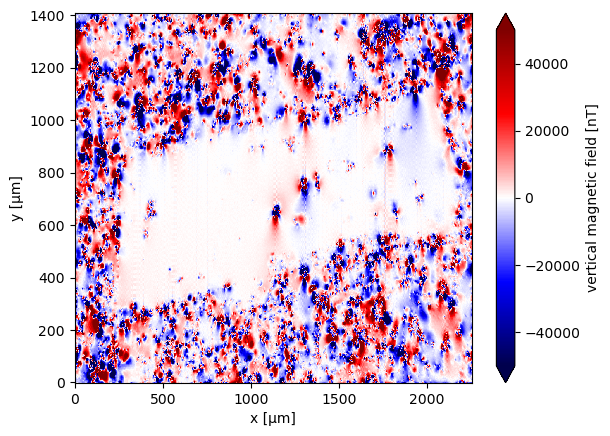

In [3]:
data.bz.plot.pcolormesh(cmap="seismic", vmax=50000, vmin=-50000)

In [4]:
# copy data sets
data_copy = data.copy(deep=True)
data_copy2 = data_copy.copy(deep=True)

x_, y_ = np.meshgrid(data.x.values, data.y.values)
coordinates = ([x_, y_ , data.z.values])

# Anomaly detection

First part of our method is an automatic way to detect and separate the signal of each dipole in the data. This is done in the following steps:

1. Upward continue the data to suppress high frequency noise
2. Calculate the total gradient amplitude (TGA) to concentrate the anomalies on top of the sources
3. Contrast stretch the TGA to highlight weaker sources
4. Run the Laplacian of Gaussian (LoG) method for blog detection to find the anomalies

## 1. Upward continue the data to suppress the high-frequency noise

In this step, we want to upward continue as little as possible to make sure we retain most of the signal.

In [5]:
height_difference = 5

# Have to assign the same points as the data because the Harmonica
# transforms give slightly different coordinates due to round-off.
# This is a bug and is being worked on.
data_up = (
    hm.upward_continuation(data.bz, height_difference)
    .assign_attrs(data.bz.attrs)
    .to_dataset(name="bz")
    .assign_coords(x=data.x, y=data.y)
    .assign_coords(z=data.z + height_difference)
)
data_up

/home/gelson/anaconda3/envs/micromag-euler-dipole/lib/python3.10/site-packages/xrft/xrft.py:573: FutureWarning: Default ifft's behaviour (lag=None) changed! Default value of lag was zero (centered output coordinates) and is now set to transformed coordinate's attribute: 'direct_lag'.
  warnings.warn(msg, FutureWarning)


<xarray.Dataset> Size: 9MB
Dimensions:  (y: 600, x: 960)
Coordinates:
  * x        (x) float64 8kB 0.0 2.35 4.7 7.05 ... 2.249e+03 2.251e+03 2.254e+03
  * y        (y) float64 5kB 0.0 2.35 4.7 7.05 ... 1.403e+03 1.405e+03 1.408e+03
    z        (y, x) float64 5MB 10.0 10.0 10.0 10.0 10.0 ... 10.0 10.0 10.0 10.0
Data variables:
    bz       (y, x) float64 5MB 2.074e+03 924.9 -298.3 ... 9.205e+03 7.321e+03

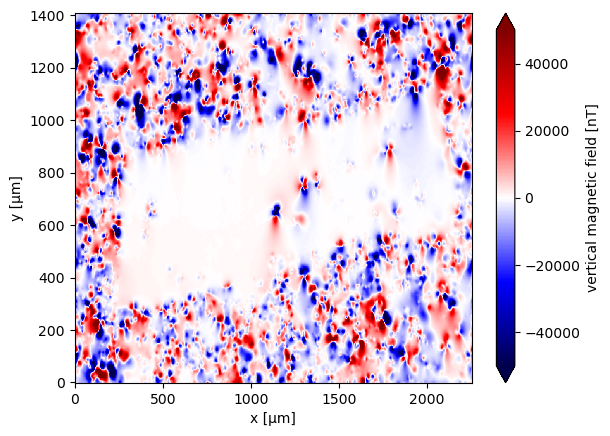

In [6]:
data_up.bz.plot.pcolormesh(cmap="seismic", vmax=50000, vmin=-50000)

## 2. Calculate the TGA

We do this with finite difference derivatives to avoid amplifying noise.

In [7]:
data_up = data_up.assign(mg.data_gradients(data_up.bz))
data_up

/home/gelson/anaconda3/envs/micromag-euler-dipole/lib/python3.10/site-packages/xrft/xrft.py:573: FutureWarning: Default ifft's behaviour (lag=None) changed! Default value of lag was zero (centered output coordinates) and is now set to transformed coordinate's attribute: 'direct_lag'.
  warnings.warn(msg, FutureWarning)
/home/gelson/anaconda3/envs/micromag-euler-dipole/lib/python3.10/site-packages/xrft/xrft.py:573: FutureWarning: Default ifft's behaviour (lag=None) changed! Default value of lag was zero (centered output coordinates) and is now set to transformed coordinate's attribute: 'direct_lag'.
  warnings.warn(msg, FutureWarning)


<xarray.Dataset> Size: 28MB
Dimensions:  (y: 600, x: 960)
Coordinates:
  * x        (x) float64 8kB 0.0 2.35 4.7 7.05 ... 2.249e+03 2.251e+03 2.254e+03
  * y        (y) float64 5kB 0.0 2.35 4.7 7.05 ... 1.403e+03 1.405e+03 1.408e+03
    z        (y, x) float64 5MB 10.0 10.0 10.0 10.0 10.0 ... 10.0 10.0 10.0 10.0
Data variables:
    bz       (y, x) float64 5MB 2.074e+03 924.9 -298.3 ... 9.205e+03 7.321e+03
    tga      (y, x) float64 5MB 925.6 754.1 666.4 ... 2.657e+03 2.235e+03
    x_deriv  (y, x) float64 5MB -488.8 -504.7 -539.1 ... 155.9 -456.2 -801.6
    y_deriv  (y, x) float64 5MB -785.9 -485.4 -296.9 ... -2.229e+03 -1.686e+03
    z_deriv  (y, x) float64 5MB 10.3 -279.8 -255.6 ... -1.372e+03 -1.229e+03

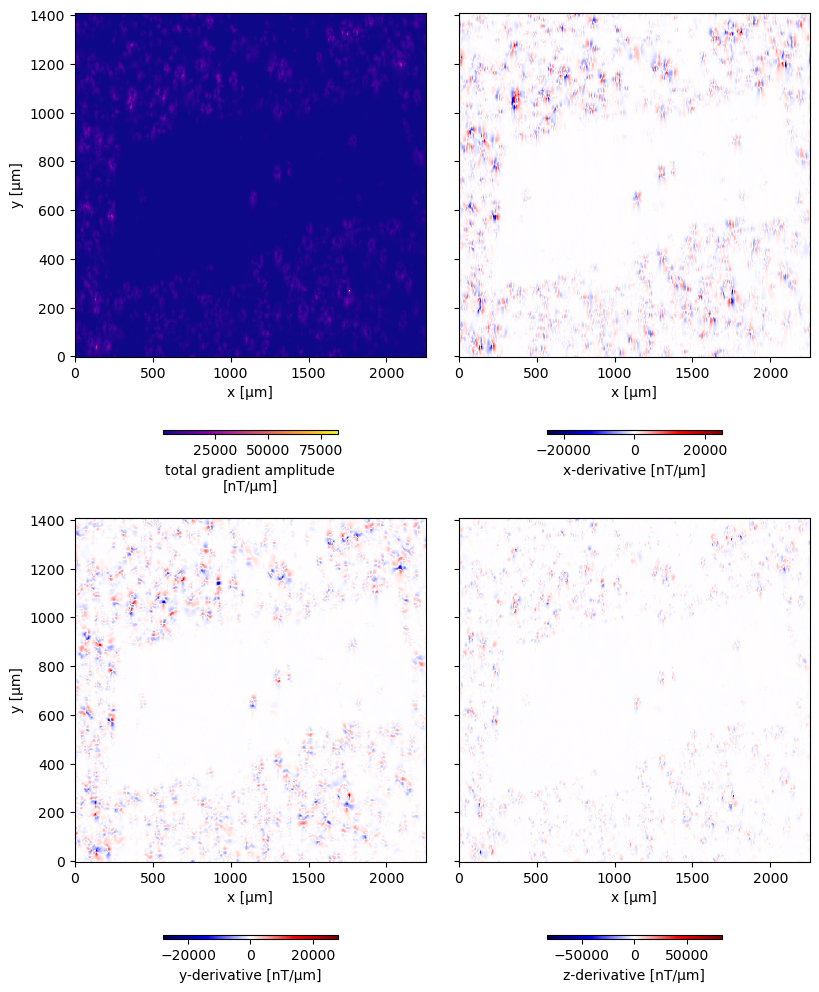

In [8]:
fig, axes = plt.subplots(2, 2, figsize=(8, 10), sharey="row")
cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.15, shrink=0.5)
for field, ax in zip(["tga", "x_deriv", "y_deriv", "z_deriv"], axes.ravel()):
    if field == "tga":
        cmap = "plasma"
    else:
        cmap="seismic"
    data_up[field].plot.pcolormesh(ax=ax, cmap=cmap, cbar_kwargs=cbar_kwargs)
for ax in axes.ravel():
    ax.set_aspect("auto")
    
axes[0,1].set_ylabel(None)
axes[1,1].set_ylabel(None)
plt.tight_layout(pad=0, h_pad=0, w_pad=2)

## 3. Stretch the contrast

Now we need to stretch the contrast of the TGA to make the anomalies easier to detect.

In [9]:
stretched = skimage.exposure.rescale_intensity(
    data_up.tga, 
    in_range=tuple(np.percentile(data_up.tga, (1, 99))),
)
data_up = data_up.assign(tga_stretched=xr.DataArray(stretched, coords=data_up.coords))

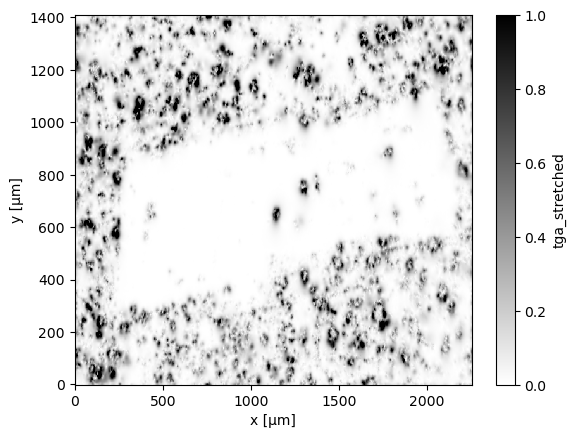

In [10]:
data_up.tga_stretched.plot.pcolormesh(cmap="gray_r")

## 4. Blob detection

To detect the bounding boxes of each anomaly, we use the LoG method in scikit-image. The code below calls it with some conveniences, like passing the range of anomaly sizes in physical units (µm) instead of number of pixels. It returns the bounding box of each anomaly (x_min, x_max, y_min, y_max) also in physical units.

In [11]:
start_detection_time = time.perf_counter()

windows = mg.detect_anomalies(
    data_up.tga_stretched, 
    size_range=[20, 100],
    size_increment=1.0,
    threshold=0.05,
    overlap=1.0,
    exclude_border=30,
    nsizes=20,
)

end_detection_time = time.perf_counter()

In [12]:
detection_time = end_detection_time-start_detection_time

print(f'{np.shape(windows)[0]} potential sources detected within {round(detection_time, 4)} seconds', )

638 potential sources detected within 1.7368 seconds


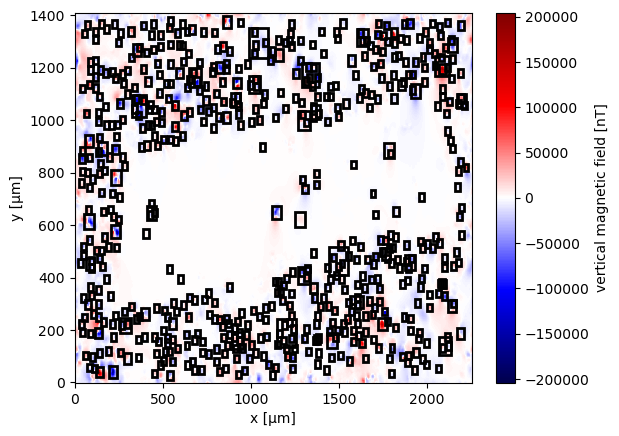

In [13]:
ax = plt.subplot(111)
data_up.bz.plot.pcolormesh(ax=ax, cmap="seismic")
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)   

Now that we know the bounding box of each anomaly, we can run the Euler deconvolution and moment inversion for each anomaly separately.

# Euler Deconvolution and Inversion (Standard method)

Run the Euler Deconvolution and the inversion on each window.

In [14]:
start_inversion_time = time.perf_counter()

positions = []
estimated_dipole_moments = []
estimated_stds = []
calculated_r2 = []
calculated_SNR = []
windows_filtered = []
base_levels = []
for window in windows:
    anomaly = data_up.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    position, base_level = mg.euler_deconvolution(
        anomaly.bz, 
        anomaly.x_deriv, 
        anomaly.y_deriv, 
        anomaly.z_deriv,
    )
    
#     anomaly = data.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    data_minus_background = anomaly.bz.values - base_level
    anomaly = anomaly.assign(data_minus_background=(['y','x'], data_minus_background))
    anomaly.data_minus_background.attrs = {"long_name": "dipole-model", "units": "nT"}

    moment, covariance, r2, SNR = mg.dipole_moment_inversion(
        anomaly.data_minus_background, position,
    )
    
    # Filter out solutions that don't meet quality criteria
    bad_euler = False # position[2] > 0
    poor_fit = False
    
#    bad_euler = position[2] > 0
#     poor_fit = r2 < 0.85
    if bad_euler or poor_fit:
        continue
#     print("R²: %s and SNR: %s"%(r2,SNR))  
    positions.append(position)  
    estimated_dipole_moments.append(moment)
    estimated_stds.append(mg.covariance_to_angle_std(moment, covariance))
    calculated_r2.append(r2)
    calculated_SNR.append(SNR)
    windows_filtered.append(window)
    base_levels.append(base_level)
positions = np.transpose(positions)


end_inversion_time = time.perf_counter()

In [15]:
inversion_time = end_inversion_time-start_inversion_time
print(f"{positions.shape[1]} euler positions and dipole moments estimated within {round(inversion_time, 4)} seconds", )

638 euler positions and dipole moments estimated within 2.8118 seconds


# Iterative Euler deconvolution

In [16]:
import scipy as sp
import numba
import choclo
# @numba.jit(nopython=True, parallel=True)
def goal_function(parameter, obs_data, coordinates, amplitude, x_0, y_0, z_0):
    bz = mg.dipole_bz(coordinates, 
                      ([parameter[0]*x_0], [parameter[1]*y_0], [parameter[2]*z_0]),
                     np.array([parameter[3], parameter[4], parameter[5]])*amplitude
                     )
                   
    
    Res = np.linalg.norm(obs_data-bz.ravel())
    # print(Res)
    return(Res)

In [17]:
x_, y_ = np.meshgrid(data.x.values, data.y.values)
coordinates = ([x_, y_ , data.z.values])

In [18]:
import warnings
import rich.progress

warnings.filterwarnings("ignore")

start_itr_euler_time = time.perf_counter()


x_concat = []
y_concat = []
z_concat = []
bz_concat = []
xc_concat = []
yc_concat = []
zc_concat = []
z_deriv_concat = []

estimated_dipole_moments_itr_euler = []

# fitting parameters
calculated_r2_itr_euler = []
calculated_SNR_itr_euler = []

data_copy = data.copy(deep=True)
data_up_copy = data_up.copy(deep=True)

base_levels_itr_euler = []
#################################
for window in rich.progress.track(np.array(windows), total = len(np.array(windows))):
    anomaly = data_up_copy.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    position, base_level = mg.euler_deconvolution(
        anomaly.bz, 
        anomaly.x_deriv, 
        anomaly.y_deriv, 
        anomaly.z_deriv,
    )

    base_levels_itr_euler.append(base_level)
    data_minus_background = anomaly.bz.values - base_level 
    anomaly = anomaly.assign(data_minus_background=(['y','x'], data_minus_background))
    anomaly.data_minus_background.attrs = {"long_name": "dipole-model", "units": "nT"}

    
    moment, covariance, r2, SNR = mg.dipole_moment_inversion(anomaly.data_minus_background, position)

    ## SCIPY MINIMIZATION

    anomaly_table=vd.grid_to_table(anomaly)
    amplitude = np.linalg.norm(moment)
    args=(data_minus_background.ravel(), 
         ( anomaly_table.x.values,
           anomaly_table.y.values, 
           anomaly.z.values.ravel()),
          amplitude, position[0], position[1], position[2])
    
    minimization=sp.optimize.minimize(goal_function, (1, 1, 1,
                                                      moment[0]/amplitude,
                                                      moment[1]/amplitude,
                                                      moment[2]/amplitude),
                                      
                                      args=args,
                                      
                                        method='Nelder-Mead', options=dict(fatol=1.0e-8))
    
    # print(minimization.x[0])
    if minimization.success:
        
        moment = np.array([minimization['x'][3], minimization['x'][4], minimization['x'][5]])*amplitude
        position = np.array([minimization['x'][0]*position[0], 
                             minimization['x'][1]*position[1],
                             minimization['x'][2]*position[2]])
        xxx, yyy = np.meshgrid(anomaly.x.values, anomaly.y.values)
        zzz = anomaly.z.values.ravel()
        pred = mg.dipole_bz([xxx, yyy, zzz], 
                  position,
                  moment
                 )
        
        residuals = data_minus_background.ravel() - pred.ravel()
        residuals_sum_sq = np.sum(residuals**2)
        r2 = 1 - residuals_sum_sq / np.linalg.norm(data_minus_background.ravel() - np.mean(data_minus_background.ravel())) ** 2


    estimated_dipole_moments_itr_euler.append(moment)
    
    #########
    
    discard = mg.dipole_bz(coordinates, position, moment)

    data_copy.bz.values -= discard
    
#     print(discard.max())
    data_up_copy = (
                hm.upward_continuation(data_copy.bz, height_difference)
                .assign_attrs(data_copy.bz.attrs)
                .to_dataset(name="bz")
                .assign_coords(x=data_copy.x, y=data_copy.y)
                .assign_coords(z=data_copy.z + height_difference)
                   )
    
    
    data_up_copy = data_up_copy.assign(mg.data_gradients(data_up_copy.bz))
    
    
    ########
    # Filter out solutions that don't meet quality criteria
    bad_euler = False #position[2] > 0.0
    poor_fit =  False # r2 < 0.85  

    if bad_euler or poor_fit:
        continue
#     print("R²: %s and SNR: %s | %s"%(r2,SNR,position[2]))  
    xx, yy = np.meshgrid(anomaly.x.values, anomaly.y.values)
    x_concat = np.append(x_concat, xx)
    y_concat = np.append(y_concat, yy)    
    z_concat = np.append(z_concat, anomaly.z.values)
    bz_concat = np.append(bz_concat, anomaly.bz.values)
    z_deriv_concat = np.append(z_deriv_concat, anomaly.z_deriv.values)
    xc_concat = np.append(xc_concat, position[0])
    yc_concat = np.append(yc_concat, position[1])
    zc_concat = np.append(zc_concat, position[2])
    calculated_r2_itr_euler = np.append(calculated_r2_itr_euler, r2)
    calculated_SNR_itr_euler = np.append(calculated_SNR_itr_euler, SNR)


end_itr_euler_time = time.perf_counter()
warnings.resetwarnings()

Output()

In [19]:
itr_euler_time = end_itr_euler_time-start_itr_euler_time
print(f"Time for the iterative Euler solution and dipole moment estimation: {round(itr_euler_time, 4)} seconds", )

Time for the iterative Euler solution and dipole moment estimation: 161.3346 seconds


In [20]:
df = pd.DataFrame({'x':x_concat,
                   'y':y_concat,
                   'z':z_concat,
                  'bz':bz_concat,
                 'z_deriv':z_deriv_concat})

df.head()

,x,y,z,bz,z_deriv
0,573.40,1160.9,10.0,-6262.156530,-1522.436118
1,575.75,1160.9,10.0,-9494.240164,-1254.084936
2,578.10,1160.9,10.0,-14461.380342,-187.546388
3,580.45,1160.9,10.0,-20554.260287,2037.668936
4,582.80,1160.9,10.0,-24973.747119,4646.897048


In [21]:
positions_itr = np.array([xc_concat, yc_concat, zc_concat])

In [22]:
# indexes = np.where(~np.array(euler_r2_itr_cond))[0]
# indexes
# euler_r2_itr_cond

Output()

Output()

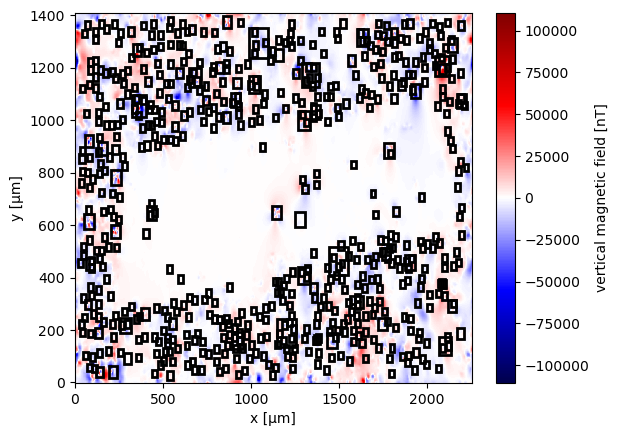

In [23]:
## EULER ENHANCEMENT SECOND STEP
warnings.filterwarnings("ignore")
data_copy = data.copy(deep=True)
euler_r2_itr_cond = calculated_r2_itr_euler>=0.999

zc_concat_temp = list()
xc_concat_temp = list()
yc_concat_temp = list()

estimated_dipole_moments_itr_euler_temp = list()

indexes = np.where(np.array(euler_r2_itr_cond))[0]
# SOURCES WITH R2 >= 0.99 ARE NOT ENHANCED, WE CALCULATE THEIR ANOMALY AND REMOVE THEM FROM THE DATA SET
# for index, window in enumerate(rich.progress.track(np.array(windows)[euler_r2_itr_cond], total=len(np.array(windows)[euler_r2_itr_cond]))):
for index in rich.progress.track(indexes, total=len(indexes)):
    window = windows[index]
    position = positions_itr[:, index]
    estimated_dipole_moments_itr_euler_temp.append(estimated_dipole_moments_itr_euler[index])
    xc_concat_temp = np.append(xc_concat_temp, position[0])
    yc_concat_temp = np.append(yc_concat_temp, position[1])
    zc_concat_temp = np.append(zc_concat_temp, position[2])  

    
# remove all signals 
position_temp = np.array([xc_concat_temp, yc_concat_temp, zc_concat_temp])
discard = mg.dipole_bz(coordinates, position_temp, estimated_dipole_moments_itr_euler_temp)
data_copy.bz.values -= discard

data_up_copy = (
            hm.upward_continuation(data_copy.bz, height_difference)
            .assign_attrs(data_copy.bz.attrs)
            .to_dataset(name="bz")
            .assign_coords(x=data_copy.x, y=data_copy.y)
            .assign_coords(z=data_copy.z + height_difference)
               )


data_up_copy = data_up_copy.assign(mg.data_gradients(data_up_copy.bz))

# SOURCES WITH R2 <= 0.99 ARE ENHANCED
indexes = np.where(~np.array(euler_r2_itr_cond))[0]
# for index, window in enumerate(rich.progress.track(np.array(windows)[~euler_r2_itr_cond], total=len(np.array(windows)[~euler_r2_itr_cond]))):
for index in rich.progress.track(indexes, total=len(indexes)):
    window = windows[index]
    anomaly = data_up_copy.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    position, base_level = mg.euler_deconvolution(
        anomaly.bz, 
        anomaly.x_deriv, 
        anomaly.y_deriv, 
        anomaly.z_deriv,
    )
    data_minus_background = anomaly.bz.values - base_level 
    anomaly = anomaly.assign(data_minus_background=(['y','x'], data_minus_background))
    anomaly.data_minus_background.attrs = {"long_name": "dipole-model", "units": "nT"}
    
    moment, covariance, r2, SNR = mg.dipole_moment_inversion(anomaly.data_minus_background, position)



    ## SCIPY MINIMIZATION
    anomaly_table=vd.grid_to_table(anomaly)
    amplitude = np.linalg.norm(moment)
    args=(data_minus_background.ravel(), 
         ( anomaly_table.x.values,
           anomaly_table.y.values, 
           anomaly.z.values.ravel()),
          amplitude, position[0], position[1], position[2])
    
    minimization=sp.optimize.minimize(goal_function, (1, 1, 1,
                                                      moment[0]/amplitude,
                                                      moment[1]/amplitude,
                                                      moment[2]/amplitude),
                                      
                                      args=args,
                                      
                                        method='Nelder-Mead', options=dict(fatol=1.0e-8))
    
    # print(minimization.x[0])
    if minimization.success:
        
        moment = np.array([minimization['x'][3], minimization['x'][4], minimization['x'][5]])*amplitude
        position = np.array([minimization['x'][0]*position[0], 
                             minimization['x'][1]*position[1],
                             minimization['x'][2]*position[2]])
        xxx, yyy = np.meshgrid(anomaly.x.values, anomaly.y.values)
        zzz = anomaly.z.values.ravel()
        pred = mg.dipole_bz([xxx, yyy, zzz], 
                  position,
                  moment
                 )
        
        residuals = data_minus_background.ravel() - pred.ravel()
        residuals_sum_sq = np.sum(residuals**2)
        r2 = 1 - residuals_sum_sq / np.linalg.norm(data_minus_background.ravel() - np.mean(data_minus_background.ravel())) ** 2
        
        if r2 >= calculated_r2_itr_euler[index]:
            estimated_dipole_moments_itr_euler[index] = moment
            positions_itr[:, index] = position
    
    
    discard = mg.dipole_bz(coordinates, position, moment)

    data_copy.bz.values -= discard

    data_up_copy = (
                hm.upward_continuation(data_copy.bz, height_difference)
                .assign_attrs(data_copy.bz.attrs)
                .to_dataset(name="bz")
                .assign_coords(x=data_copy.x, y=data_copy.y)
                .assign_coords(z=data_copy.z + height_difference)
                   )
    
    
    data_up_copy = data_up_copy.assign(mg.data_gradients(data_up_copy.bz))



ax = plt.subplot(111)
data_up_copy.bz.plot.pcolormesh(ax=ax, cmap="seismic")
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)   


# Comparison plots

## Euler comparison

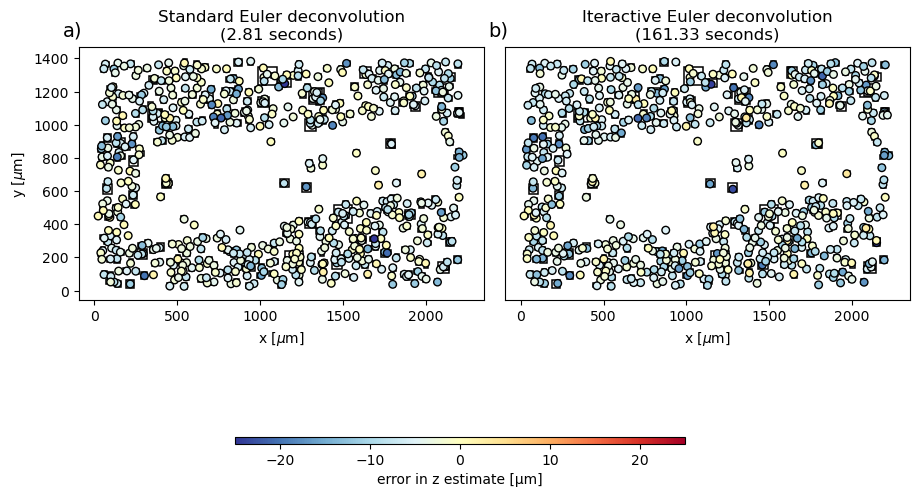

In [24]:
fig, axes = plt.subplots(1, 2, figsize=(9, 9))
cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.015, shrink=0.5)

# data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-3000, vmax=3000, add_colorbar=False)
axes = axes.ravel()

scale = vd.maxabs((positions[2]))

ax = axes[0]
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=1.1,
    )
    ax.add_patch(rect)

tmp = ax.scatter(*positions[:2], c=positions[2], cmap="RdYlBu_r", vmin=-scale, vmax=scale, s=30, edgecolor='k')

ax = axes[1]
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=1.1,
    )
    ax.add_patch(rect)

tmp = ax.scatter(*positions_itr[:2], c=positions_itr[2], cmap="RdYlBu_r", vmin=-scale, vmax=scale, s=30, edgecolor='k')

titles = ([r'Standard Euler deconvolution'   +'\n'+ f'({round(inversion_time, 2)} seconds)', 
           r'Iteractive Euler deconvolution' +'\n'+ f'({round(itr_euler_time, 2)} seconds)'])
for ax, letter, title in zip(axes, "a b".split(), titles):
    ax.text(-0.04, 1.045, f"{letter})", transform=ax.transAxes, fontsize=14)
    ax.set_aspect("equal")
    ax.set_title(title)
    ax.set_xlabel(r"x [$\mu$m]")

axes[1].set_yticks([])
axes[0].set_ylabel(r"y [$\mu$m]")
plt.tight_layout(pad=0, h_pad=0, w_pad=0.6)


fig.colorbar(tmp, **cbar_kwargs, label="error in z estimate [µm]", cax=fig.add_axes([0.25, 0.2, 0.5, 0.0075]))


plt.show()

In [25]:
fig_dir = pathlib.Path("..") / "paper" / "figures"
mpl_rc = {"text.usetex": True, "font.family": "serif", "font.size": 9}

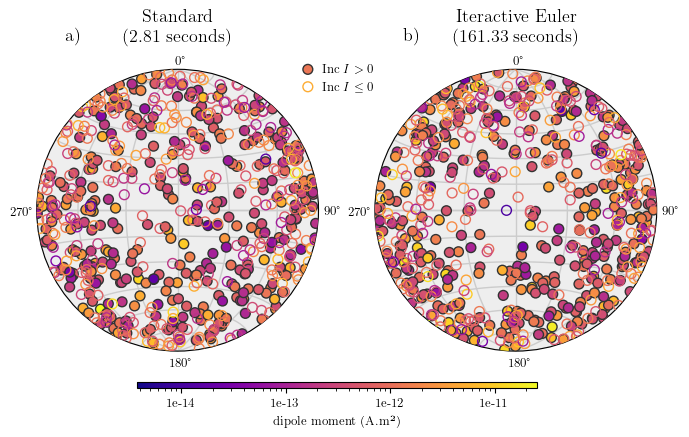

In [26]:
with plt.rc_context(mpl_rc):
    fig = plt.figure(figsize=(8, 4))
    axes = []

#     estimated = mg.vector_to_angles(estimated_dipole_moments)[2]
#     vmin = np.min(estimated)
#     vmax = np.max(estimated)
    
    estimated1 = mg.vector_to_angles(estimated_dipole_moments)[2]
    estimated2 = mg.vector_to_angles(estimated_dipole_moments_itr_euler)[2]

    
    vmin = np.min([np.min(estimated1),np.min(estimated2)])
    vmax = np.max([np.max(estimated1),np.max(estimated2)])
    
    cmap = "plasma"
    # Use matplotlib.colors.LogNorm for a log scale
    cmap_norm = matplotlib.colors.LogNorm #Normalize

        
    ## STANDARD METHOD
    ax = fig.add_subplot(1, 2, 1, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(estimated_dipole_moments, marker="o", zorder=1000, label="Inc", **kwargs)
    ax.legend(loc=(0.9, 0.9), frameon=False, handletextpad=0.1, prop = {'size' : 9})
    fig.colorbar(
        tmp, 
        cax=fig.add_axes([0.25, 0.05, 0.5, 0.015]), 
        format="%.0g",
        label="dipole moment (A.m²)",
        orientation="horizontal",
    )

    
    ## ITERACTIVE METHOD
    ax = fig.add_subplot(1, 2, 2, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(estimated_dipole_moments_itr_euler, marker="o", zorder=1000, label="Inc", **kwargs)

    
    ######
    titles = ([r'Standard'+'\n'+ f'({round(inversion_time, 2)} seconds)', 
           'Iteractive Euler'+'\n'+ f'({round(itr_euler_time, 2)} seconds)']) 
 

    for ax, letter, title in zip(axes, "a b".split(), titles):
        ax.text(0.1, 1.1, f"{letter})   ", transform=ax.transAxes, fontsize=13)
        ax.set_title(title+'\n', fontsize=13, loc='center')
    fig.subplots_adjust(wspace=0.2, hspace=0.5)

    plt.show()


# Paper's figures 

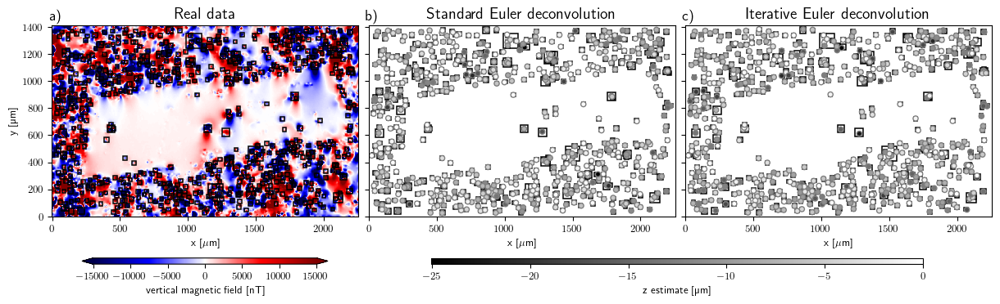

In [27]:
with plt.rc_context(mpl_rc):
    fig, axes = plt.subplots(1, 3, figsize=(12, 5), sharey=True, sharex=True)
    cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.0, shrink=0.5)

    # data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-3000, vmax=3000, add_colorbar=False)
    axes = axes.ravel()

    ax = axes[0]


    tmp1 = data_up['bz'].plot.pcolormesh(ax=ax, cmap='seismic', vmin=-15000, vmax=15000, add_colorbar=False)#, cbar_kwargs=cbar_kwargs)
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1.1,
        )
        ax.add_patch(rect)


    scale = vd.maxabs((positions[2]))

    ax = axes[1]
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1.1,
        )
        ax.add_patch(rect)

    tmp = ax.scatter(*positions[:2], c=positions[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')

    ax = axes[2]
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1.1,
        )
        ax.add_patch(rect)

    tmp = ax.scatter(*positions_itr[:2], c=positions_itr[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')

    titles = ([r'Real data',
               r'Standard Euler deconvolution', 
               r'Iterative Euler deconvolution'])
    for ax, letter, title in zip(axes, "a b c".split(), titles):
        ax.text(-0.01, 1.025, f"{letter})", transform=ax.transAxes, fontsize=13)
        ax.set_aspect("equal")
        ax.set_title(title, fontsize=14)
        ax.set_xlabel(r"x [$\mu$m]")

    plt.tight_layout(pad=0, h_pad=0, w_pad=0.6)


    fig.colorbar(tmp1, **cbar_kwargs, extend='both', label="vertical magnetic field [nT]", cax=fig.add_axes([0.075, 0.15, 0.25, 0.015]))
    fig.colorbar(tmp, **cbar_kwargs, label="z estimate [µm]", cax=fig.add_axes([0.43, 0.15, 0.5, 0.015]))
    # fig.savefig(fig_dir/"euler-comparion-real.png", dpi=300, facecolor='w', bbox_inches='tight')
    
plt.show()


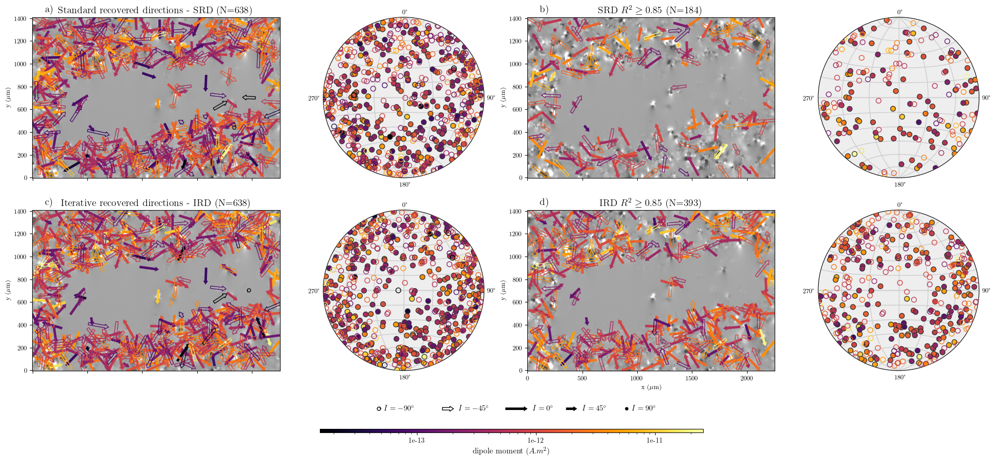

In [28]:
import warnings
warnings.filterwarnings('ignore')

r_square_filter = 0.85

with plt.rc_context(mpl_rc):
    fig = plt.figure(figsize=(25, 9))
    
    axes = []

    estimated = mg.vector_to_angles(estimated_dipole_moments)[2]
    vmin = np.min(estimated)
    vmax = np.max(estimated)
    cmap = "inferno"
    # Use matplotlib.colors.LogNorm for a log scale
    cmap_norm = matplotlib.colors.LogNorm #Normalize
    
#################################################################################################
#                                             Maps
#################################################################################################
    #1
    ax = fig.add_subplot(2, 4, 1)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    scale = 50000
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        positions, estimated_dipole_moments, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)

    pos_filter= ( (np.array(calculated_r2) > r_square_filter) & (np.array(calculated_SNR) > 5))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions)[0][pos_filter], 
                                  np.array(positions)[1][pos_filter], 
                                  np.array(positions)[2][pos_filter]
                                 ])
    #2
    ax = fig.add_subplot(2, 4, 3)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        filter_positions, filter_estimated_d_m, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)
    
#     clb = fig.colorbar(
#         tmp, 
#         cax=fig.add_axes([0.25, 0.05, 0.5, 0.0075]), 
#         format="%.0g",
# #         label="dipole moment (A.m²)",
#         orientation="horizontal"
#     )
    
#     clb.set_label(label="dipole moment ($A.m^2$)", fontsize=11)
    
#     clb.ax.tick_params(labelsize=10)


    #3
    ax = fig.add_subplot(2, 4, 5)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        positions, estimated_dipole_moments_itr_euler, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)


    pos_filter= ( (np.array(calculated_r2_itr_euler) > r_square_filter))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments_itr_euler)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions)[0][pos_filter], 
                                  np.array(positions)[1][pos_filter], 
                                  np.array(positions)[2][pos_filter]
                                 ])
    #4
    ax = fig.add_subplot(2, 4, 7)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        filter_positions, filter_estimated_d_m, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )

    ax.set_ylabel("y ($\mu$m)")
    ax.set_xlabel("x ($\mu$m)")

    
    clb = fig.colorbar(
        tmp, 
        # cax=fig.add_axes([0.12, -0.025, 0.73, 0.0075]), 
        cax=fig.add_axes([0.35, -0.025, 0.3, 0.0075]), 
        format="%.0g",
#         label="dipole moment (A.m²)",
        orientation="horizontal"
    )
    
    clb.set_label(label="dipole moment ($A.m^2$)", fontsize=11)
    
    clb.ax.tick_params(labelsize=10)
#################################################################################################
#                                           Stereograms
#################################################################################################
    #1
    ax = fig.add_subplot(2, 4, 2, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    
    tmp = mg.plot_stereonet(estimated_dipole_moments, marker="o", zorder=1000, label="Inc", **kwargs, add_ticks=True)
    
    N1 = np.asarray(estimated_dipole_moments).shape[0]
    
    pos_filter= ( (np.array(calculated_r2) > r_square_filter) & (np.array(calculated_SNR) > 5))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,2][pos_filter]
                                     ]).T

    N2 = filter_estimated_d_m.shape[0]
    #2
    ax = fig.add_subplot(2, 4, 4, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(filter_estimated_d_m, marker="o", zorder=1000, **kwargs, add_ticks=True)


    #3
    ax = fig.add_subplot(2, 4, 6, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    
    tmp = mg.plot_stereonet(estimated_dipole_moments_itr_euler, marker="o", zorder=1000, label="Inc", **kwargs, add_ticks=True)
    
    N3 = np.asarray(estimated_dipole_moments_itr_euler).shape[0]
    
    pos_filter= ( (np.array(calculated_r2_itr_euler) > r_square_filter))

    filter_estimated_d_m_itr = np.array( [np.array(estimated_dipole_moments_itr_euler)[:,0][pos_filter], 
                                          np.array(estimated_dipole_moments_itr_euler)[:,1][pos_filter], 
                                          np.array(estimated_dipole_moments_itr_euler)[:,2][pos_filter]
                                         ]).T
    
    N4 = filter_estimated_d_m_itr.shape[0]
    #4
    ax = fig.add_subplot(2, 4, 8, projection='stereonet')
    axes.append(ax)   

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(filter_estimated_d_m_itr, marker="o", zorder=1000, **kwargs, add_ticks=True)
    # ax.legend(loc=(-0.35, -0.05), frameon=False, handletextpad=0.1, prop = {'size' : 12})


    # Inc values seem to be reversed because the function uses 90 - inc to plot instead of inc.
    ax.quiverkey(negquiver,-0.6, -0.235, 0., label="$I = -90^\circ$", labelpos="E", edgecolor='k', 
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(negquiver, -0.3, -0.235, 45, label="$I = -45^\circ$", labelpos="E", edgecolor='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.0, -0.235, 90, label="$I =   0^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.2, -0.235, 45, label="$I =  45^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.4, -0.235, 0., label="$I =  90^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    
    titles = (f'Standard recovered directions - SRD (N={N1})', f'SRD $R^2 \geq {r_square_filter}$ (N={N2})',
              f'Iterative recovered directions - IRD (N={N3})', f'IRD $R^2 \geq {r_square_filter}$ (N={N4})')

    for ax, letter, title in zip(axes, "a b c d".split(), titles):
        ax.text(0.05, 1.031, f"{letter})", transform=ax.transAxes, fontsize=14)
        ax.set_title(title, fontsize=14)
        ax.set_aspect("auto")
    
        
    fig.subplots_adjust(wspace=0.0, hspace=0.2)
    # fig.savefig(fig_dir/"real-data-stereograms.png", dpi=300, facecolor='w', bbox_inches='tight')
    # fig.savefig("real-data-stereograms.pdf", dpi=300, facecolor='w', bbox_inches='tight')
    plt.show()

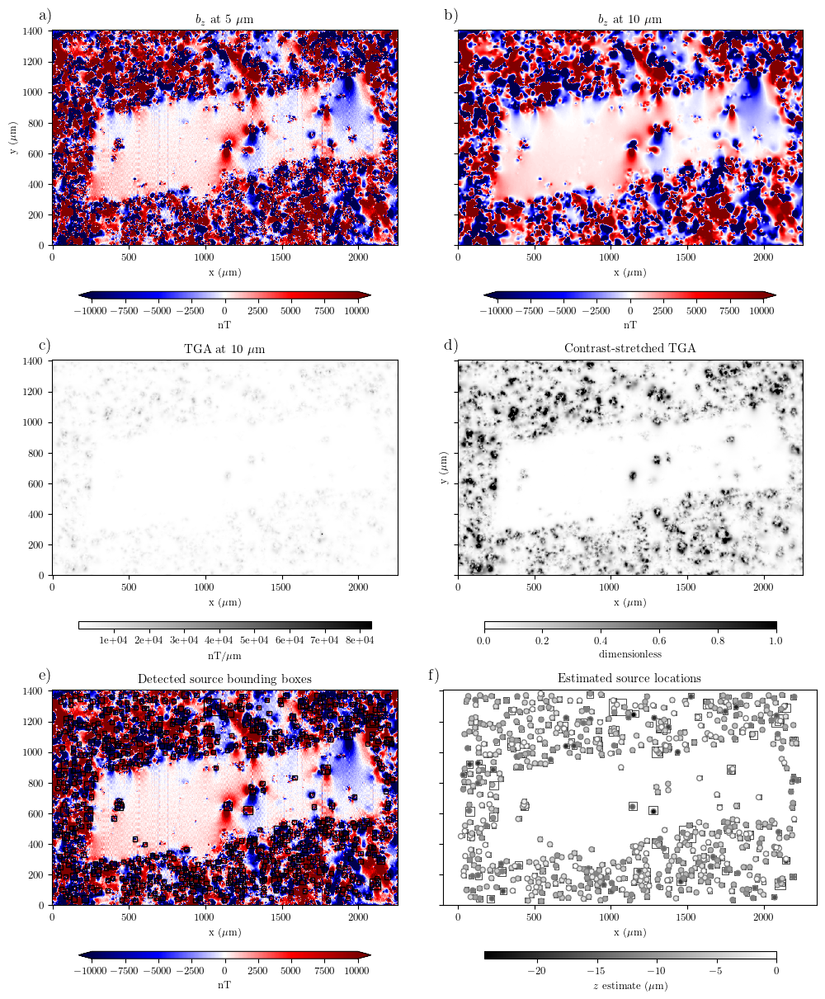

In [29]:
sensor_sample_distance = float(data.z.values.mean())
vmax=+10000
vmin=-10000
with plt.rc_context(mpl_rc):

    fig, axes = plt.subplots(3, 2, figsize=(12, 12), sharey="row")
    axes = axes.ravel()    
    cbar_kwargs = dict(orientation="horizontal", aspect=40, pad=0.15, shrink=0.5)
    
    ax = axes[0]
    ax.set_aspect("equal")
    ax.set_title(f"$b_z$ at {sensor_sample_distance:.0f} $\mu$m")
    ax.set_xlabel("x ($\mu$m)")
    ax.set_ylabel("y ($\mu$m)")
    tmp = data.bz.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False, vmax=vmax, vmin=vmin)
    fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
    

    ax = axes[1]
    ax.set_aspect("equal")
    ax.set_title(f"$b_z$ at {sensor_sample_distance + height_difference:.0f} $\mu$m")
    ax.set_xlabel("x ($\mu$m)")
    tmp = data_up.bz.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False, vmax=vmax, vmin=vmin)
    fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
    
    ax = axes[2]   
    ax.set_aspect("equal")
    ax.set_title(f"TGA at {sensor_sample_distance + height_difference:.0f} $\mu$m")
    ax.set_xlabel("x ($\mu$m)")
    tmp = data_up.tga.plot.pcolormesh(ax=ax, cmap="gray_r", add_colorbar=False, add_labels=False)
    fig.colorbar(tmp, ax=ax, label="nT/$\mu$m", **cbar_kwargs, format="%.0e")
    
    ax = axes[3]  
    ax.set_aspect("equal")
    ax.set_title(f"Contrast-stretched TGA")
    ax.set_xlabel("x ($\mu$m)")
    ax.set_ylabel("y ($\mu$m)")
    tmp = data_up.tga_stretched.plot.pcolormesh(ax=ax, cmap="gray_r", add_colorbar=False, add_labels=False)
    fig.colorbar(tmp, ax=ax, label="dimensionless", **cbar_kwargs)
    
    ax = axes[4]  
    ax.set_aspect("equal")
    ax.set_title(f"Detected source bounding boxes")
    ax.set_xlabel("x ($\mu$m)")
    tmp = data.bz.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False, vmax=vmax, vmin=vmin)
    fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')    
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1,
        )
        ax.add_patch(rect)   
    
        
    ax = axes[5]  
    ax.set_aspect("equal")
    ax.set_title(f"Estimated source locations")
    ax.set_xlabel("x ($\mu$m)")
    scale = 100
#     tmp = data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r",  add_colorbar=False, add_labels=False)
    for window in windows_filtered:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=0.5,
        )
        ax.add_patch(rect)
    scale = vd.maxabs(positions_itr[2])
    tmp = ax.scatter(*positions_itr[:2], c=positions_itr[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')
    fig.colorbar(tmp, ax=ax, label="$z$ estimate ($\mu$m)", **cbar_kwargs)    
    
    for ax, letter in zip(axes, "a b c d e f".split()):
        ax.text(-0.04, 1.045, f"{letter})", transform=ax.transAxes, fontsize=14)

    plt.tight_layout(pad=0, h_pad=0, w_pad=-10)
    
    # fig.savefig("processing_steps.png", dpi=300, facecolor='w', bbox_inches='tight')
    
    plt.show()

In [30]:
data_up_copy = (
            hm.upward_continuation(data_copy.bz, height_difference)
            .assign_attrs(data_copy.bz.attrs)
            .to_dataset(name="bz")
            .assign_coords(x=data_copy.x, y=data_copy.y)
            .assign_coords(z=data_copy.z + height_difference)
               )


In [31]:
data_up_copy = data_up_copy.assign(mg.data_gradients(data_up_copy.bz))
data_up_copy

<xarray.Dataset> Size: 28MB
Dimensions:  (y: 600, x: 960)
Coordinates:
  * x        (x) float64 8kB 0.0 2.35 4.7 7.05 ... 2.249e+03 2.251e+03 2.254e+03
  * y        (y) float64 5kB 0.0 2.35 4.7 7.05 ... 1.403e+03 1.405e+03 1.408e+03
    z        (y, x) float64 5MB 10.0 10.0 10.0 10.0 10.0 ... 10.0 10.0 10.0 10.0
Data variables:
    bz       (y, x) float64 5MB 1.848e+03 823.7 -305.0 ... 8.496e+03 6.795e+03
    tga      (y, x) float64 5MB 869.2 725.5 645.9 ... 2.561e+03 2.154e+03
    x_deriv  (y, x) float64 5MB -436.0 -458.2 -503.4 ... 211.6 -386.7 -723.8
    y_deriv  (y, x) float64 5MB -751.6 -465.8 -286.5 ... -2.143e+03 -1.621e+03
    z_deriv  (y, x) float64 5MB -22.56 -315.3 -285.7 ... -1.347e+03 -1.22e+03

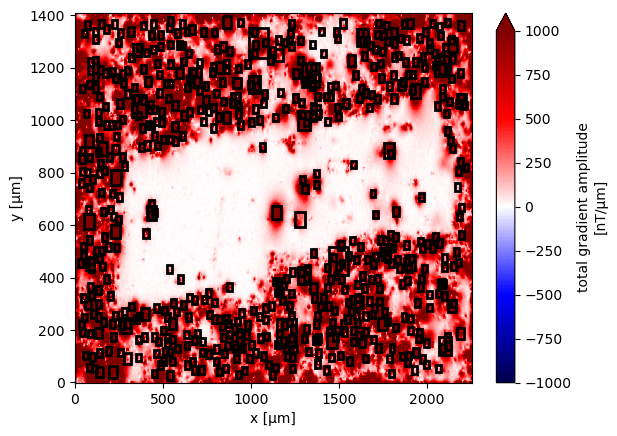

In [32]:
ax = plt.subplot(111)
scale=1000
data_up_copy.tga.plot.pcolormesh(ax=ax, cmap="seismic", vmin=-scale, vmax=scale)
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)   

In [33]:
stretched = skimage.exposure.rescale_intensity(
    data_up_copy.tga, 
    in_range=tuple(np.percentile(data_up_copy.tga, (1, 99))),
)
data_up_copy = data_up_copy.assign(tga_stretched=xr.DataArray(stretched, coords=data_up.coords))

In [34]:
start_detection_time = time.perf_counter()

windows_new = mg.detect_anomalies(
    data_up_copy.tga_stretched, 
    size_range=[20,150],
    size_increment=1.3,
    threshold=0.025,
    overlap=0.0,
    exclude_border=15
)
# windows
end_detection_time = time.perf_counter()

In [35]:
detection_time = end_detection_time-start_detection_time
print(f'{np.shape(windows_new)[0]} potential sources detected within {round(detection_time, 4)} seconds', )

620 potential sources detected within 1.4513 seconds


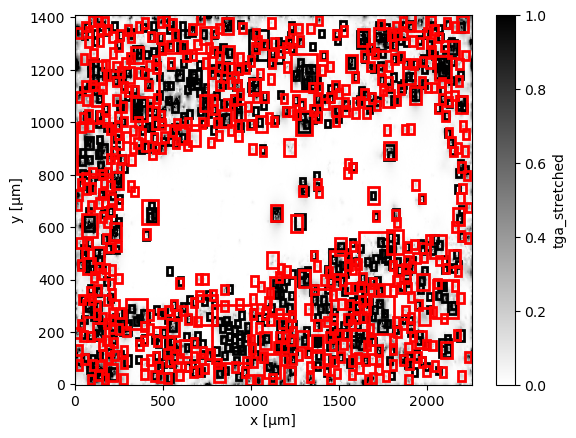

In [36]:
ax = plt.subplot(111)
data_up_copy = data_up_copy.assign(tga_stretched=xr.DataArray(stretched, coords=data_up_copy.coords))
data_up_copy.tga_stretched.plot.pcolormesh(cmap="gray_r")

for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)

for window in windows_new:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="r",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)

In [37]:
def intersects(window1, window2):
    # Verifica se há sobreposição horizontal
    horizontal_overlap = (window1[0] <= window2[1]) and (window2[0] <= window1[1])
    # Verifica se há sobreposição vertical
    vertical_overlap = (window1[2] <= window2[3]) and (window2[2] <= window1[3])
    return horizontal_overlap and vertical_overlap
    


# Remove overlapping windows
non_overlapping_windows = np.copy(windows_new)

for window in windows:
    non_overlapping_windows = [nw for nw in non_overlapping_windows if not intersects(nw, window)]

print("Non-overlapping windows:")
for window in non_overlapping_windows:
    print(window)

Non-overlapping windows:
[1025.01522369 1061.78477631   -1.93477631   34.83477631]
[468.06522369 504.83477631   7.46522369  44.23477631]
[  2.76522369  39.53477631 703.06522369 739.83477631]
[ 696.01522369  732.78477631 1375.16522369 1411.93477631]
[ 5.11522369 41.88477631 56.81522369 93.58477631]
[4.15223689e-01 3.71847763e+01 1.32111522e+03 1.35788478e+03]
[1675.96522369 1712.73477631    5.11522369   41.88477631]
[1318.76522369 1355.53477631    7.46522369   44.23477631]
[1370.46522369 1407.23477631 1370.46522369 1407.23477631]
[1.64776522e+03 1.68453478e+03 4.15223689e-01 3.71847763e+01]
[ 73.26522369 110.03477631   0.41522369  37.18477631]
[ 470.41522369  507.18477631 1363.41522369 1400.18477631]
[2216.46522369 2253.23477631  540.91522369  577.68477631]
[2216.46522369 2253.23477631   87.36522369  124.13477631]
[  2.76522369  39.53477631 113.21522369 149.98477631]
[1878.06522369 1914.83477631   -1.93477631   34.83477631]
[ -1.93477631  34.83477631 665.46522369 702.23477631]
[2221.165

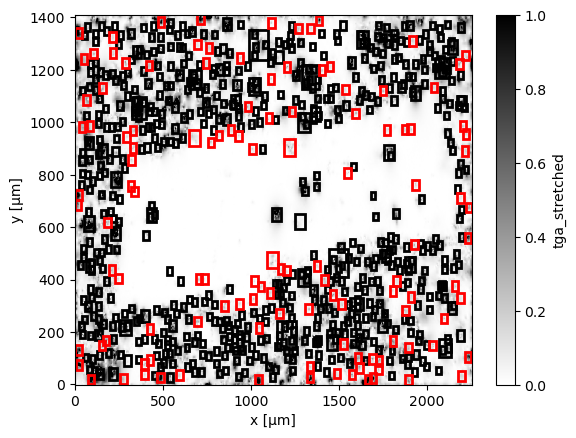

In [38]:
ax = plt.subplot(111)
data_up_copy = data_up_copy.assign(tga_stretched=xr.DataArray(stretched, coords=data_up_copy.coords))
data_up_copy.tga_stretched.plot.pcolormesh(cmap="gray_r")

for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)
for window in non_overlapping_windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="r",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)

In [39]:
import warnings
import rich.progress

warnings.filterwarnings("ignore")

start_itr_euler_time = time.perf_counter()

data_copy_2 = data_copy.copy(deep=True)
data_up_copy_2 = data_up_copy.copy(deep=True)

positions_itr_enhanced = list(np.copy(positions_itr))
estimated_dipole_moments_itr_euler_enhanced = list(np.copy(estimated_dipole_moments_itr_euler))
windows_enhanced = list(np.copy(windows))
calculated_r2_itr_euler_enhanced = list(np.copy(calculated_r2_itr_euler))
base_levels_itr_euler_enhanced = list(np.copy(base_levels_itr_euler))

#################################
for window in rich.progress.track(np.array(non_overlapping_windows), total = len(np.array(non_overlapping_windows))):
    anomaly = data_up_copy_2.sel(x=slice(*window[:2]), y=slice(*window[2:]))
    position, base_level = mg.euler_deconvolution(
        anomaly.bz, 
        anomaly.x_deriv, 
        anomaly.y_deriv, 
        anomaly.z_deriv,
    )
    
    data_minus_background = anomaly.bz.values - base_level 
    anomaly = anomaly.assign(data_minus_background=(['y','x'], data_minus_background))
    anomaly.data_minus_background.attrs = {"long_name": "dipole-model", "units": "nT"}

    base_levels_itr_euler_enhanced.append(base_level)
    moment, covariance, r2, SNR = mg.dipole_moment_inversion(anomaly.data_minus_background, position)

    ## SCIPY MINIMIZATION

    anomaly_table=vd.grid_to_table(anomaly)
    amplitude = np.linalg.norm(moment)
    args=(data_minus_background.ravel(), 
         ( anomaly_table.x.values,
           anomaly_table.y.values, 
           anomaly.z.values.ravel()),
          amplitude, position[0], position[1], position[2])
    
    minimization=sp.optimize.minimize(goal_function, (1, 1, 1,
                                                      moment[0]/amplitude,
                                                      moment[1]/amplitude,
                                                      moment[2]/amplitude),
                                      
                                      args=args,
                                      
                                        method='Nelder-Mead', options=dict(fatol=1.0e-8))
    
    # print(minimization.x[0])
    if minimization.success:
        
        moment = np.array([minimization['x'][3], minimization['x'][4], minimization['x'][5]])*amplitude
        position = np.array([minimization['x'][0]*position[0], 
                             minimization['x'][1]*position[1],
                             minimization['x'][2]*position[2]])
        xxx, yyy = np.meshgrid(anomaly.x.values, anomaly.y.values)
        zzz = anomaly.z.values.ravel()
        pred = mg.dipole_bz([xxx, yyy, zzz], 
                  position,
                  moment
                 )
        
        residuals = data_minus_background.ravel() - pred.ravel()
        residuals_sum_sq = np.sum(residuals**2)
        r2 = 1 - residuals_sum_sq / np.linalg.norm(data_minus_background.ravel() - np.mean(data_minus_background.ravel())) ** 2
    else:
        print('piorou')


    windows_enhanced.append(window)
    estimated_dipole_moments_itr_euler_enhanced.append(moment)
    for i in range(3):
        positions_itr_enhanced[i]=np.append(positions_itr_enhanced[i], position[i])
    calculated_r2_itr_euler_enhanced.append(r2)
    # estimated_dipole_moments_itr_euler.append(moment)
    print(position)
    print(moment)
    print(mg.vector_to_angles(moment))
    print(r2)
    print()
    #########
    
    discard = mg.dipole_bz(coordinates, position, moment)

    data_copy_2.bz.values -= discard
    
#     print(discard.max())
    data_up_copy_2 = (
                hm.upward_continuation(data_copy_2.bz, height_difference)
                .assign_attrs(data_copy_2.bz.attrs)
                .to_dataset(name="bz")
                .assign_coords(x=data_copy_2.x, y=data_copy_2.y)
                .assign_coords(z=data_copy_2.z + height_difference)
                   )
    
    
    data_up_copy_2 = data_up_copy_2.assign(mg.data_gradients(data_up_copy_2.bz))
    
    
    ########
    # Filter out solutions that don't meet quality criteria
    bad_euler = False #position[2] > 0.0
    poor_fit =  False # r2 < 0.85  

    if bad_euler or poor_fit:
        continue


end_itr_euler_time = time.perf_counter()
warnings.resetwarnings()

Output()

[1040.07680245   12.60507622  -10.37620816]

[-2.34828685e-12 -3.45630384e-13 -2.33160150e-12]

(44.4887594632633, -98.37290941511012, 3.3272025885494738e-12)

0.9490340435136165

[484.46140217  20.98277339  -8.58049427]

[4.70116927e-13 1.98471103e-12 1.15100511e-12]

(-29.43693809635621, 13.326001557851514, 2.3419864581314825e-12)

0.9521662162840236

[ 13.61600904 718.19151795  -8.78364634]

[1.35951640e-12 1.66802984e-12 1.03253255e-12]

(-25.63295144234042, 39.181521688020155, 2.3867827449199935e-12)

0.9137960566419849

[ 716.13245005 1393.74913014   -3.69423918]

[-4.33156484e-13 -6.83607242e-13 -7.88026175e-14]

(5.5615315864379316, -147.64028137390076, 8.13113309025872e-13)

0.8430396346820972

[18.87441913 79.13312136 -9.21447747]

[ 2.29892148e-12 -1.46701203e-12  6.23382414e-13]

(-12.875830256052398, 122.54319137108827, 2.79745776077347e-12)

0.9595091486631832

[  17.13120984 1344.48099128  -12.60742043]

[-5.13370017e-13 -6.47497264e-12 -3.44368623e-13]

(3.0348769817251444, -175.466771080018, 6.504414592601209e-12)

0.9758606425395374

[1692.88236037   23.91774102   -3.01813814]

[ 3.47519377e-14  1.67163397e-13 -4.10915354e-13]

(67.43685571000854, 11.744053662100017, 4.4497497301498576e-13)

0.8661906605764503

[1337.17089477   24.88747344   -7.58104803]

[-8.64039822e-15  1.21521690e-12 -7.86591294e-13]

(32.913703318124746, -0.4073758430160671, 1.4476023739388965e-12)

0.8994206077997036

[1386.64834268 1389.38828872   -2.31657973]

[ 2.38389741e-13 -7.55423825e-14  1.76409489e-13]

(-35.20040606351936, 107.58268201674336, 3.060337041817485e-13)

0.9694949909978172

[1664.58599707   15.07578459   -4.92044119]

[ 4.26393997e-13  1.05809960e-12 -1.40565415e-13]

(7.024482684863284, 21.948496575339316, 1.1494108192460251e-12)

0.8413840718652053

[91.87336718 20.56463057 -9.25651548]

[2.87948662e-12 1.06291668e-12 5.07481055e-13]

(-9.388093119160956, 69.739177390222, 3.1110724989932164e-12)

0.9435624259208893

[ 486.34029597 1380.41118022   -2.47828211]

[-2.77390036e-13 -2.35772633e-13 -1.65082597e-13]

(24.392327061900925, -130.36346956626488, 3.997326990724794e-13)

0.7666416870455741

[2238.28955077  561.7343       -9.83146266]

[ 6.75697743e-13  3.15824264e-13 -1.21052354e-12]

(58.3607197540838, 64.94839483505048, 1.4218578180380787e-12)

0.9372837047701676

[2239.5508833   109.94766673   -6.12845699]

[ 5.06172473e-13  3.14903797e-13 -5.61290516e-13]

(43.27570107926056, 58.1131222879631, 8.187930250404361e-13)

0.8860101917813988

[ 14.87518923 129.46624995  -8.78698233]

[-2.33143877e-12 -2.51720459e-13  4.20288005e-13]

(-10.161134421857403, -96.16223228868209, 2.3823542845573368e-12)

0.9299462310156741

piorou

[ 1.89756247e+03  4.56059982e+00 -1.11621054e+00]

[ 1.78378939e-13 -1.13551545e-14 -2.72286130e-14]

(8.661642502742747, 93.6423904939671, 1.8080205388173576e-13)

0.5543328252279496

[ 13.48252805 683.99456393  -4.50578318]

[1.02968968e-13 5.75253278e-13 1.03668127e-13]

(-10.05925704251619, 10.148334314068435, 5.935200275169697e-13)

0.956226132381231

[2242.0108515   676.42256177   -3.32738993]

[-8.58288943e-14 -1.94709475e-13  2.21622444e-14]

(-5.946041141757668, -156.2118788280393, 2.1393817735919408e-13)

0.9476266869245913

[174.30401553 172.77696952 -13.6150389 ]

[-1.10035934e-12  1.70306624e-12 -6.10136974e-13]

(16.7472514383633, -32.86669820807611, 2.117425893867363e-12)

0.9481367343743186

piorou

[1728.44349542   98.12827478   -2.22949526]

[-1.40544382e-13  1.87401645e-15  2.73024269e-14]

(-10.99251235291985, -89.23606430351785, 1.4318399989348226e-13)

0.4928840125580942

[1411.63314683  392.9530425   -15.30141076]

[1.03735596e-12 5.27002523e-13 5.69043115e-13]

(-26.06138207547492, 63.06830235108568, 1.295240947908322e-12)

0.8651354357370743

piorou

[2.97376546e+02 1.22701713e+03 1.42138810e-01]

[-1.30299491e-14 -5.20247575e-14 -3.56849549e-15]

(3.80668437506732, -165.93913137138406, 5.375024768564558e-14)

0.4396629520024836

piorou

[ 2.18956051e+03  1.21558912e+03 -1.67495355e+00]

[ 2.48200014e-14 -6.93516200e-14 -4.80266386e-15]

(3.7304691921734334, 160.30840235198218, 7.381561656562365e-14)

0.22649820544298316

[704.16676746 245.3200088  -17.41758169]

[ 3.18439705e-13 -7.33484670e-13 -3.27775161e-13]

(22.28921380061253, 156.53209989371203, 8.641991454574714e-13)

0.5894499418838689

[1611.45498478   66.53400068  -17.12672862]

[3.71629937e-13 1.52297840e-12 6.62445988e-13]

(-22.907398741093466, 13.713060871575161, 1.7018832841421327e-12)

0.9421198736537538

[1882.26874011  278.83021349  -11.23160933]

[ 4.21146072e-13 -5.14694569e-13  2.01742733e-13]

(-16.875465116615707, 140.70843716462252, 6.949637711834068e-13)

0.9503851414709594

[  60.27351192 1090.25623301  -20.16571433]

[4.43897161e-12 9.29692194e-13 6.79937032e-13]

(-8.526373306497637, 78.17102919899128, 4.58596891312014e-12)

0.9610845510583886

[211.80359904 440.09001857 -18.80753034]

[2.04725059e-12 3.21306434e-13 3.90225852e-14]

(-1.0787788343083848, 81.08045457837753, 2.072678358274211e-12)

0.9533229573099175

piorou

[1223.6895348   903.6913       -1.55495223]

[-2.48663875e-14  2.60811551e-14  1.80328918e-14]

(-26.584249627217638, -43.63412710695085, 4.0295769825651605e-14)

0.00983261261888635

[1802.81187596  167.24991871   -9.79718693]

[ 1.27888080e-13 -7.98296942e-13  3.40913055e-13]

(-22.863873918031228, 170.89848662483794, 8.774138586386e-13)

0.8285975236784977

[706.08957663 402.15087963  -1.4656326 ]

[ 3.19123161e-14  1.52214858e-14 -3.39902154e-14]

(43.87120627379642, 64.49986570900703, 4.9045125044873107e-14)

0.9633757889253447

piorou

[ 1.88048418e+03  9.71324641e+02 -4.49456628e-01]

[ 1.20611104e-14  4.09195029e-14 -2.59661790e-14]

(31.3279274282408, 16.42299303187669, 4.994115094873542e-14)

0.2787621013296243

[ 420.26621606 1204.43789662  -13.9554127 ]

[-6.55290870e-13  1.05360841e-12  5.57965569e-13]

(-24.213208613828197, -31.8795119741868, 1.3604493293520356e-12)

0.8608057194754621

[397.81035016  77.70105394   2.0159306 ]

[-2.57705021e-15 -1.74084983e-14 -8.62459224e-15]

(26.108711372516442, -171.57942897014627, 1.9597974144177844e-14)

0.47298602682199253

[7.72788415e+02 9.22514525e+02 8.39246636e-02]

[ 5.05958484e-15 -2.82837493e-14 -1.43426231e-14]

(26.527162344031147, 169.85782717873568, 3.2113559559646816e-14)

0.978500882599231

[1059.92094707  370.98091933   -6.33411617]

[ 8.74079121e-14 -1.49758607e-13 -7.90875047e-14]

(24.517584180098872, 149.72965612848932, 1.905849333258956e-13)

0.9208476223068677

[ 216.21992855 1269.22676491  -10.80296155]

[ 1.51383263e-13 -4.35179573e-13  9.33418115e-14]

(-11.452167457478668, 160.81905931971215, 4.701179079415323e-13)

0.9307286951772964

piorou

[ 1.57860588e+03  3.94292534e+01 -1.40137337e+00]

[-4.98088395e-14 -6.75529430e-15  1.63908624e-14]

(-18.060629132465444, -97.72358037977881, 5.286979158124995e-14)

0.2590126718037514

piorou

[1939.07187474  762.84027167   -2.20463059]

[ 3.06781564e-14 -5.33124711e-14  2.02885826e-14]

(-18.254977410058014, 150.08213305270843, 6.476878438198545e-14)

0.7365703381003903

[1692.88798657   90.30288346   -1.83269468]

[-2.03632877e-14 -7.67409965e-14 -1.70625652e-14]

(12.128543989984626, -165.138992075114, 8.120945243728365e-14)

0.6246979930307032

[2194.76528484   26.12276932  -10.72111649]

[1.94340729e-13 2.58446677e-13 2.46840781e-13]

(-37.35656989215768, 36.94158369910702, 4.0680876938783643e-13)

0.9081923259448753

[1403.66994313 1193.12590298   -5.26576428]

[4.42232844e-15 1.15945453e-13 6.61428861e-14]

(-29.68534770244663, 2.1842856697725, 1.3355817658319996e-13)

0.940766750116197

piorou

[849.82944961 300.17180942  -4.78035043]

[-1.62625878e-13  5.15441025e-14 -3.95559914e-14]

(13.054238688208594, -72.41404244101317, 1.7512466196524571e-13)

0.41183636380351973

piorou

[ 1.46813822e+03  3.36229520e+02 -1.20340687e+00]

[1.29578013e-15 7.36583325e-17 4.59132114e-14]

(-88.38079743796973, 86.74653551509127, 4.5931551851467095e-14)

0.25223800266630303

[ 3.20392585e+02  7.54053836e+02 -2.64445460e-01]

[ 1.90588100e-14 -1.50843010e-14 -1.91563864e-14]

(38.243019312807675, 128.3602337738134, 3.094739914958677e-14)

0.9046987248406844

[1918.21623516 1314.61184338   -8.28533516]

[-1.07897322e-13 -1.68668604e-13  1.76736139e-13]

(-41.43413534886677, -147.39294867319214, 2.670703897948534e-13)

0.8340741028410008

[322.16169629 853.81213755  -0.92590036]

[ 1.59681073e-14 -4.04020672e-14 -1.70208095e-14]

(21.394997155202848, 158.43458359924995, 4.6658498087444827e-14)

0.9352369871458884

piorou

[1.90155583e+03 9.69906129e+02 6.80292314e-01]

[-1.10519412e-14  6.33002713e-15 -7.95612539e-15]

(31.992136653413148, -60.19796712123009, 1.5017142804467435e-14)

0.17275048477920374

[1206.31662998 1211.26367071    3.41776524]

[-1.07607081e-14 -9.44034535e-15 -2.89891431e-15]

(11.448254193493153, -131.26040484988448, 1.460536422620823e-14)

0.36037725176562285

[1234.09396959 1039.52469972   -7.22296591]

[-3.55464260e-13  1.22147230e-13  1.41409611e-13]

(-20.617508749510964, -71.03587884798546, 4.0158618499963877e-13)

0.9263647719560345

piorou

[ 102.66877241 1253.63062505   -2.93693344]

[-5.49969256e-14 -8.12460621e-14  1.38128048e-14]

(-8.013935603338183, -145.90521972072656, 9.907763632556073e-14)

0.5610615627095404

[ 164.56259972 1139.29946825   -5.63193588]

[ 5.77019350e-14 -2.96854416e-13 -6.85114017e-14]

(12.764942711904094, 169.00013357667436, 3.1007397489239355e-13)

0.6670525687836352

[1588.17493596 1034.60447066   -8.79839852]

[-3.39959200e-13 -1.51891490e-13 -1.02674624e-13]

(15.41613275415299, -114.07477144471378, 3.862452081024192e-13)

0.8655202129009054

[426.75362209  95.18049367  -8.60181438]

[-1.59273280e-13  1.21239276e-13  1.11536006e-13]

(-29.127163144938653, -52.72150536875541, 2.2914454058197744e-13)

0.7666699610474962

piorou

[2159.67848654  376.01074265   -2.56523179]

[-2.50527162e-15  2.60504073e-14 -7.15457497e-14]

(69.90807296023144, -5.493250230656508, 7.618198215080114e-14)

0.769718029115615

[327.84345656 959.63310717 -16.39931494]

[3.72995514e-13 1.34105979e-12 5.08556642e-13]

(-20.069854938091396, 15.543104464098771, 1.4819571089146252e-12)

0.7831149675175565

[2.20660446e+03 9.83345488e+02 6.03677422e-01]

[6.90068003e-15 1.87272344e-14 1.85530520e-14]

(-42.91043146681813, 20.228018186038632, 2.7249668481627424e-14)

0.8062140455490734

[ 739.00452744 1226.93383383  -25.76063695]

[-1.58536180e-12 -1.42897434e-13 -2.27216141e-12]

(54.98639318856166, -95.15046763625767, 2.774258309155395e-12)

0.9747731129823196

piorou

[1122.63576378  472.52857961   -1.84557826]

[-1.95727892e-14  4.06308593e-14 -2.18206346e-14]

(25.819260386776506, -25.721151894437153, 5.0100907170605815e-14)

-0.02450400010065712

piorou

[1272.01200697 1352.30012857   -3.11181157]

[ 8.28241202e-14 -1.19404028e-13  7.40004842e-17]

(-0.02917691921807775, 145.25304578493208, 1.4531745377205055e-13)

0.5348582532308523

[428.15029998 210.02523978 -10.54140588]

[-1.32026671e-13 -2.73587605e-13 -1.38286844e-13]

(24.476119978643126, -154.23918266252127, 3.337730823291086e-13)

0.8811510105259677

[1746.61706608 1125.51134542  -12.48506896]

[ 5.71565554e-13 -7.09026682e-14  2.33420080e-13]

(-22.061769530814395, 97.07141267658767, 6.214493579880258e-13)

0.9406371672380702

[1012.08169031  896.90799309   -5.57082269]

[ 8.41162892e-14 -1.44808699e-14 -7.28801986e-14]

(40.49273863022116, 99.76789436535817, 1.1223532889527416e-13)

0.8707947682531304

[1769.77254573  971.72205248   -9.3176933 ]

[ 5.70429882e-14  1.93088952e-13 -8.61771493e-14]

(23.17193822943193, 16.458371832544596, 2.1900627117716267e-13)

0.8405927724444217

[151.31436582 142.07095343  -3.7978181 ]

[9.09733068e-14 1.50312834e-13 2.24936483e-14]

(-7.295541868108064, 31.183436385906163, 1.7713287349072995e-13)

0.7046906430526934

[1014.17544268  324.45506447   -4.12633627]

[ 3.42499134e-14 -4.61173702e-14 -2.65178505e-14]

(24.77926246289131, 143.3998945265201, 6.326977792745219e-14)

0.770638002227305

[  24.89019566 1227.0274482   -29.88275368]

[ 2.15640485e-11  9.36323482e-12 -5.49564415e-12]

(13.157560159404525, 66.52923498882919, 2.4142917388694823e-11)

0.9366319580344529

[329.73581555 897.19398263  -7.3435758 ]

[-7.32295449e-14 -1.82246394e-13 -5.56370345e-14]

(15.81593950367213, -158.10894160928993, 2.0413670378256238e-13)

0.8475024908988704

[ 213.36663593 1327.48500294  -11.32649782]

[-2.16651755e-13 -3.28270293e-13  3.40051820e-14]

(-4.94134140604106, -146.57599586864586, 3.9478566430854513e-13)

0.926835229537657

[678.72630936 947.0081581  -15.14034975]

[-9.46879023e-13 -2.31787822e-13  2.32418247e-13]

(-13.409984326418039, -103.75502388919905, 1.0021595282410491e-12)

0.8308058636380471

[593.95582144  34.86039012  -8.80789657]

[-2.43046145e-13  1.80663414e-13  4.45150250e-14]

(-8.362193923931633, -53.37548222220554, 3.060919553781858e-13)

0.8503924127082466

[1336.46225978  285.41953793   -8.03005416]

[ 1.16592265e-13 -1.58437516e-13 -4.95352452e-14]

(14.134030821199493, 143.65109484453464, 2.0285448791886684e-13)

0.8207770407475458

[1801.7242131   354.04632344   -4.8705238 ]

[-4.15774772e-14 -9.08910843e-14 -3.60985508e-15]

(2.0684433313387074, -155.41861280177608, 1.0001453326233448e-13)

0.892325774845267

piorou

[2024.94691644  166.54152277   -6.45515885]

[ 1.60705409e-13  2.20577014e-13 -1.55833913e-13]

(29.726635607783432, 36.07589255810625, 3.1426844568479615e-13)

0.7060816229918404

[1375.86395676  453.31328218    2.51477629]

[-3.19113330e-15  9.50125445e-15  6.28457082e-15]

(-32.08875819831709, -18.565367997788353, 1.1830173214107776e-14)

0.5280044579156292

[2223.79203123  955.22420249  -12.91644804]

[2.06685413e-13 6.59402127e-14 3.78425511e-13]

(-60.17459298884178, 72.30541347273221, 4.36202749560364e-13)

0.9283983687401687

[1881.02850574  142.71940395  -18.02535288]

[ 2.00963403e-12 -1.39180318e-12  6.86851043e-13]

(-15.693996016289637, 124.70513736297886, 2.539194633446805e-12)

0.9597904528953993

[2213.84117785  888.25205096  -11.75281097]

[-4.29280851e-13 -3.93571237e-13 -2.43545399e-13]

(22.693768176057223, -132.5150731922835, 6.312643895111201e-13)

0.9321019326887312

[1442.84312781 1207.53857618  -20.73121951]

[-1.03984608e-12 -9.55528509e-13 -4.32183694e-13]

(17.015960767163214, -132.5803197336158, 1.47685386688677e-12)

0.9876590632637302

[1935.41774769  531.28137014   -9.41908609]

[2.02106014e-13 1.94440267e-13 1.01658410e-13]

(-19.924536059683163, 46.107462917904954, 2.983090523845515e-13)

0.7481154793758225

piorou

[267.81678664  16.29232125 -30.94763016]

[ 1.03547068e-11 -1.01687705e-13 -5.16965505e-12]

(26.52985906419751, 90.56265128091364, 1.1573920119294387e-11)

0.9624912297371777

[1162.60858498  266.05493823   -5.74812917]

[-9.64360773e-14 -1.19625543e-13 -1.23892197e-13]

(38.87907611860721, -141.12599200358824, 1.9738151883446757e-13)

0.833122628274869

[ 985.1461936  1057.21378424  -10.51315194]

[ 5.38726317e-13 -2.88382567e-13  1.85354408e-15]

(-0.1737971129699242, 118.16033916747129, 6.110597229480778e-13)

0.7664875510311342

[1.04625012e+03 2.17872092e+02 6.80240774e-01]

[-2.41466774e-14 -1.10473894e-14 -4.17426916e-16]

(0.9006163896912416, -114.5846529064511, 2.6557128797662206e-14)

0.47208774781231044

[239.22408711 407.16285245  -4.9289516 ]

[ 3.84464077e-14 -3.40870887e-14  5.02501658e-14]

(-44.36224078448329, 131.56061667687203, 7.186887395856524e-14)

0.8557311596199452

[ 771.93238154 1279.18955937  -19.78966571]

[ 1.99298591e-12 -1.00478386e-12 -4.44281105e-13]

(11.2578874708012, 116.75541599623958, 2.275734855360454e-12)

0.9891974893916783

[ 1.11715312e+03  1.38427186e+03 -3.71327927e-01]

[-7.71527889e-15 -2.23825407e-14  1.27119564e-14]

(-28.232987879955925, -160.98088834068398, 2.687187174940782e-14)

0.7645436872930823

[932.38512571 302.00873636 -11.1192595 ]

[ 1.56310969e-13 -1.89261815e-13 -4.06710201e-14]

(9.407843214887846, 140.44676503268096, 2.4881174726532265e-13)

0.7707898058343712

[1101.42246516  343.21580948  -12.38477031]

[-1.15609963e-13  4.99618087e-13  8.10098590e-15]

(-0.9050234026423184, -13.028744142644598, 5.128835367027497e-13)

0.749351453555207

piorou

[ 2.19281029e+03  7.14406801e+02 -7.72659240e-01]

[2.22127444e-14 1.61556291e-14 1.03667086e-14]

(-20.678039456802175, 53.97109825834792, 2.935777598447219e-14)

0.46898526173395605

[1917.12677076  331.56345267  -23.28325218]

[-2.08143188e-12  4.51321729e-13 -1.56999256e-12]

(36.395960595771626, -77.76581130173223, 2.6459264158318857e-12)

0.9757902599010273

[2092.14398697  260.72573552   -9.48418797]

[-2.13439216e-13  1.77984848e-13  7.65991384e-14]

(-15.409486332151259, -50.17560785997204, 2.882747528654188e-13)

0.8507712298506749

[ 930.40332862 1237.55047631  -11.49280974]

[ 3.78204485e-13 -2.45318533e-13 -6.27805333e-14]

(7.9283032122231, 122.9690525715839, 4.551496572133458e-13)

0.8919614441209219

[184.90496334 615.24595755  -7.89844195]

[-2.67112940e-16 -3.68720893e-13 -1.07347725e-13]

(16.2321466691716, -179.9584931537154, 3.8402955926067684e-13)

0.8878795316264398

[885.0638676  973.15343661 -15.24300982]

[-1.12756489e-12 -3.79276820e-14 -4.61001334e-14]

(2.339894017566316, -91.92652068890068, 1.1291440613708743e-12)

0.9423552414213675

[1829.77629875  391.85527819   -6.3106431 ]

[ 3.65251732e-14 -1.66252225e-13 -1.11109555e-14]

(3.7346933485097566, 167.60912256383887, 1.7057943588391496e-13)

0.922201623436605

[  47.34424841 1001.88206244  -10.56999075]

[-1.63670741e-12 -1.71726362e-12 -4.06956236e-13]

(9.734061135512395, -136.37587460799193, 2.406952194939316e-12)

0.6772219813527015

[1489.41623676   39.62351537  -14.07191752]

[ 5.35920442e-13 -5.15994512e-13  2.16205773e-15]

(-0.16651185629650436, 133.9148028190627, 7.439527744397191e-13)

0.9215646844429373

piorou

[2071.43353725 1130.61295939  -16.41733261]

[5.19864170e-13 7.18881356e-13 3.70967661e-12]

(-76.55048893103773, 35.87284072634032, 3.814282328291196e-12)

0.6970841512769852

[396.10726402  33.30835147  -7.72390635]

[ 1.42454628e-14 -1.67881206e-13 -4.78362109e-14]

(15.850332108623883, 175.14981832963417, 1.7514375685024436e-13)

0.9364859644071476

[1535.14095485 1122.18500978   -9.5018318 ]

[-9.45438683e-14  2.04465851e-13  7.54731222e-14]

(-18.522900805953007, -24.81555775173352, 2.3757318739438007e-13)

0.9294837167598334

[1730.10347823   67.0106995    -5.43439694]

[-9.50960084e-14  9.32288014e-14  3.38798977e-14]

(-14.273618496327158, -45.56805887877889, 1.3741436494091718e-13)

0.7513496059397

piorou

[1332.74798016 1343.71524977  -21.50158729]

[-4.25330984e-13 -1.90266279e-12  2.04944746e-13]

(-6.000902543357055, -167.3989829105291, 1.9603659021749746e-12)

0.6329800822157238

[1018.7177347   393.20843796   -1.58294879]

[1.06547799e-14 6.27738989e-15 1.58642191e-14]

(-52.0628514193328, 59.49503022768724, 2.0114755910722855e-14)

0.9288004263083384

[2184.56876811  336.12616064  -21.0695059 ]

[-4.53879138e-13 -1.36367298e-12  9.82826759e-13]

(-34.36577630298422, -161.59071280769805, 1.7411371886543313e-12)

0.983066066028022

piorou

[1.11492760e+03 1.01393519e+03 2.24235546e-01]

[-5.69160553e-15  1.13413390e-14 -1.23564789e-15]

(5.561730102600711, -26.64960275868093, 1.274939879588047e-14)

0.10634082085804042

[734.30164758 403.06099194  -2.39925936]

[-6.53413363e-15 -1.50349459e-14  2.24849882e-14]

(-53.904836072830896, -156.51040681061437, 2.7826591476659718e-14)

0.9467118472448035

[1512.52397919  303.96622792  -11.5330678 ]

[-3.30576572e-13  4.80433793e-13  7.30557239e-14]

(-7.140336412950385, -34.53105738684026, 5.877368782837123e-13)

0.9230205262880742

piorou

[ 694.18150003 1311.68318501  -10.54783001]

[ 3.51610864e-13 -3.24615598e-14 -2.58326662e-13]

(36.18858971557844, 95.27473168475747, 4.3751184781519106e-13)

0.7447730615281929

[ 3.38278914e+02  7.32471661e+02 -2.11286978e-01]

[-8.23214930e-15 -1.27523875e-14 -4.66579939e-15]

(17.087013682975137, -147.15622500173902, 1.587958920594422e-14)

0.7919182804543468

[2221.82511227 1251.55415511  -21.05803256]

[-6.35387751e-13  2.10723180e-12 -5.37648000e-13]

(13.727426663328306, -16.77948877693536, 2.2656585854768623e-12)

0.9105720007653928

[1547.6686819   804.5451527    -4.87032823]

[3.48898000e-14 2.09534400e-14 2.76066354e-14]

(-34.150043094643365, 59.01263064769421, 4.917795349410762e-14)

0.8359558989411837

piorou

[1603.37539342   98.6381155   -11.25092336]

[ 5.84297907e-13  5.04601604e-16 -4.09830844e-13]

(35.04609180404359, 89.95051918770616, 7.136985498467505e-13)

0.32195094391063617

[1119.63863642 1164.17951106   -6.11734668]

[ 2.29832395e-14 -5.56522622e-14 -3.86876887e-14]

(32.722033174555655, 157.56038159105114, 7.156913333943322e-14)

0.615354275333106

[ 80.36156772 990.71572371 -14.2908056 ]

[ 3.14990560e-13  7.45786308e-13 -8.25783686e-13]

(45.56776221975606, 22.897267622625318, 1.1564319980791799e-12)

0.910664901173729

[1199.00905839  430.75186151   -9.50563231]

[ 2.70757272e-13 -1.51386932e-13  1.19623975e-14]

(-2.2083917243472837, 119.21061026308888, 3.1043614888475236e-13)

0.9587430165352822

[286.03548633 940.20656963 -11.25394821]

[-2.33627259e-13 -1.56377260e-13 -4.63723361e-14]

(9.366499462871852, -123.79617953806483, 2.849314604518877e-13)

0.9067237227247447

[1539.65624777  151.04286984  -10.00056369]

[-6.43961524e-13  1.23138279e-13 -1.75181146e-13]

(14.959702448145743, -79.17458642766466, 6.786294374983635e-13)

0.8232466681185124

[835.32219302 958.07435189  -5.42928459]

[1.95457543e-13 8.90261829e-14 1.12639101e-13]

(-27.674578733060294, 65.51188292049147, 2.4252191581392545e-13)

0.6279397120058356

[1176.81461165  434.42237377   -7.25848361]

[ 1.43361655e-13 -5.29007441e-14 -6.24979926e-14]

(22.244077437411867, 110.25416405813765, 1.6509709838450048e-13)

0.9044167172227986

[1339.33442232   70.1622204    -7.81378312]

[ 1.05426723e-13  1.10083634e-13 -9.45396193e-14]

(31.808818438880873, 43.76210201029075, 1.7936259395149377e-13)

0.9163545277762835

[940.64638362 949.00388016 -14.8829216 ]

[ 1.66741065e-13 -2.99438734e-13 -1.41687171e-13]

(22.46037413936889, 150.88895647442666, 3.708657345089132e-13)

0.8616629543414233

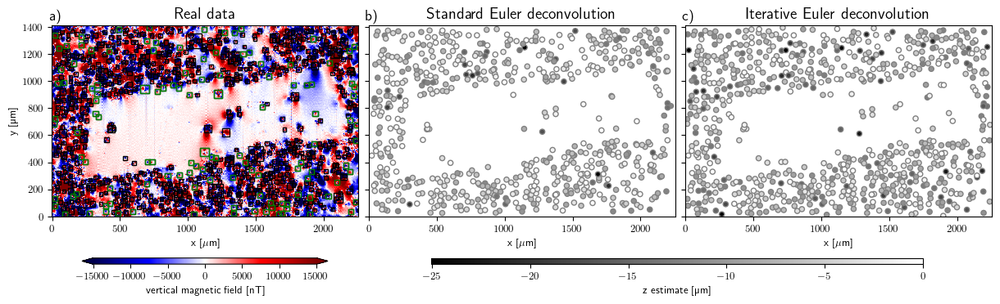

In [40]:
with plt.rc_context(mpl_rc):
    fig, axes = plt.subplots(1, 3, figsize=(12, 5), sharey=True, sharex=True)
    cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.0, shrink=0.5)

    axes = axes.ravel()

    ax = axes[0]
    tmp1 = data['bz'].plot.pcolormesh(ax=ax, cmap='seismic', vmin=-15000, vmax=15000, add_colorbar=False)#, cbar_kwargs=cbar_kwargs)
    for window in windows_enhanced:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="k",
            fill=False,
            linewidth=1,
        )
        ax.add_patch(rect)

    for window in non_overlapping_windows:
        rect = matplotlib.patches.Rectangle(
            xy=[window[0], window[2]],
            width=window[1] - window[0],
            height=window[3] - window[2],
            edgecolor="g",
            fill=False,
            linewidth=1,
        )
        ax.add_patch(rect)


    scale = vd.maxabs((positions[2]))

    ax = axes[1]
    tmp = ax.scatter(*positions[:2], c=positions[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')

    ax = axes[2]
    tmp = ax.scatter(*positions_itr_enhanced[:2], c=positions_itr_enhanced[2], s=20, cmap="gray", vmin=-scale, vmax=0, edgecolor='gray')

    titles = ([r'Real data',
               r'Standard Euler deconvolution', 
               r'Iterative Euler deconvolution'])
    for ax, letter, title in zip(axes, "a b c".split(), titles):
        ax.text(-0.01, 1.025, f"{letter})", transform=ax.transAxes, fontsize=13)
        ax.set_aspect("equal")
        ax.set_title(title, fontsize=14)
        ax.set_xlabel(r"x [$\mu$m]")

    plt.tight_layout(pad=0, h_pad=0, w_pad=0.6)


    fig.colorbar(tmp1, **cbar_kwargs, extend='both', label="vertical magnetic field [nT]", cax=fig.add_axes([0.075, 0.15, 0.25, 0.015]))
    fig.colorbar(tmp, **cbar_kwargs, label="z estimate [µm]", cax=fig.add_axes([0.43, 0.15, 0.5, 0.015]))
    # fig.savefig(fig_dir / "euler-comparion-real.png", dpi=300, facecolor='w', bbox_inches='tight')
    
plt.show()


<>:32: DeprecationWarning: invalid escape sequence '\m'
<>:58: DeprecationWarning: invalid escape sequence '\m'
<>:86: DeprecationWarning: invalid escape sequence '\m'
<>:114: DeprecationWarning: invalid escape sequence '\m'
<>:115: DeprecationWarning: invalid escape sequence '\m'
<>:195: DeprecationWarning: invalid escape sequence '\c'
<>:197: DeprecationWarning: invalid escape sequence '\c'
<>:199: DeprecationWarning: invalid escape sequence '\c'
<>:201: DeprecationWarning: invalid escape sequence '\c'
<>:203: DeprecationWarning: invalid escape sequence '\c'
<>:206: DeprecationWarning: invalid escape sequence '\g'
<>:207: DeprecationWarning: invalid escape sequence '\g'
<>:32: DeprecationWarning: invalid escape sequence '\m'
<>:58: DeprecationWarning: invalid escape sequence '\m'
<>:86: DeprecationWarning: invalid escape sequence '\m'
<>:114: DeprecationWarning: invalid escape sequence '\m'
<>:115: DeprecationWarning: invalid escape sequence '\m'
<>:195: DeprecationWarning: invalid e

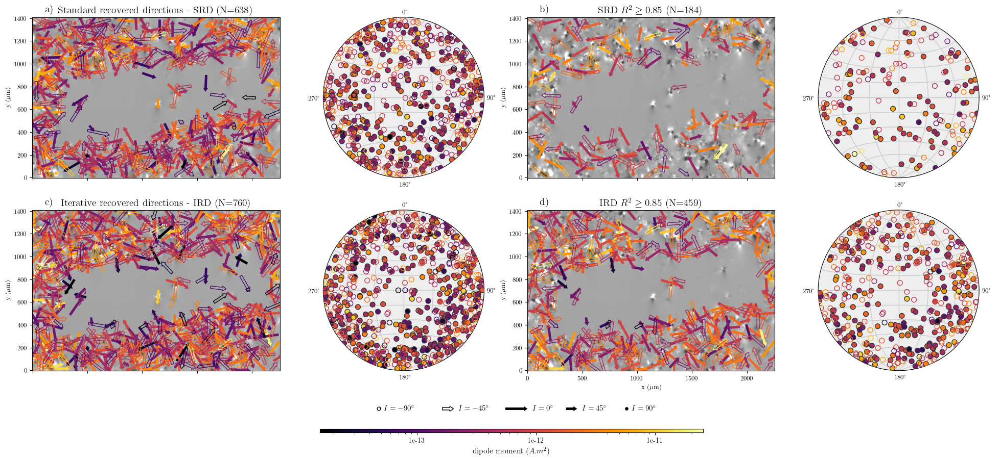

In [41]:
import warnings
warnings.filterwarnings('ignore')

with plt.rc_context(mpl_rc):
    fig = plt.figure(figsize=(25, 9))
    
    axes = []

    estimated = mg.vector_to_angles(estimated_dipole_moments)[2]
    vmin = np.min(estimated)
    vmax = np.max(estimated)
    cmap = "inferno"
    # Use matplotlib.colors.LogNorm for a log scale
    cmap_norm = matplotlib.colors.LogNorm #Normalize
    
#################################################################################################
#                                             Maps
#################################################################################################
    #1
    ax = fig.add_subplot(2, 4, 1)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    scale = 50000
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        positions, estimated_dipole_moments, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)

    pos_filter= ( (np.array(calculated_r2) > 0.85) & (np.array(calculated_SNR) > 5))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions)[0][pos_filter], 
                                  np.array(positions)[1][pos_filter], 
                                  np.array(positions)[2][pos_filter]
                                 ])
    #2
    ax = fig.add_subplot(2, 4, 3)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        filter_positions, filter_estimated_d_m, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)
    
#     clb = fig.colorbar(
#         tmp, 
#         cax=fig.add_axes([0.25, 0.05, 0.5, 0.0075]), 
#         format="%.0g",
# #         label="dipole moment (A.m²)",
#         orientation="horizontal"
#     )
    
#     clb.set_label(label="dipole moment ($A.m^2$)", fontsize=11)
    
#     clb.ax.tick_params(labelsize=10)


    #3
    ax = fig.add_subplot(2, 4, 5)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        positions_itr_enhanced, estimated_dipole_moments_itr_euler_enhanced, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )
    ax.set_ylabel("y ($\mu$m)")
    plt.xticks(color='w', alpha=0.0)


    pos_filter= ( (np.array(calculated_r2_itr_euler_enhanced) > 0.85))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments_itr_euler_enhanced)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler_enhanced)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments_itr_euler_enhanced)[:,2][pos_filter] 
                                     ]).T
    
    filter_positions = np.array( [np.array(positions_itr_enhanced)[0][pos_filter], 
                                  np.array(positions_itr_enhanced)[1][pos_filter], 
                                  np.array(positions_itr_enhanced)[2][pos_filter]
                                 ])
    #4
    ax = fig.add_subplot(2, 4, 7)
    axes.append(ax)
    ax.set_title("Estimated dipole moments over the synthetic $b_z$")
    data_up.bz.plot.pcolormesh(ax=ax, cmap="gray_r", vmin=-scale, vmax=scale, 
                                   add_colorbar=False, add_labels=False, alpha=0.7, zorder=-1)
 
    tmp, posquiver, negquiver = mg.plot_dipole_moment(
        filter_positions, filter_estimated_d_m, 
        ax=ax, vmin=vmin, vmax=vmax, cmap=cmap, cmap_norm=cmap_norm, 
        scale=1000, width=0.01, linewidth=1, add_key=False, add_colorbar=False,
    )

    ax.set_ylabel("y ($\mu$m)")
    ax.set_xlabel("x ($\mu$m)")

    
    clb = fig.colorbar(
        tmp, 
        # cax=fig.add_axes([0.12, -0.025, 0.73, 0.0075]), 
        cax=fig.add_axes([0.35, -0.025, 0.3, 0.0075]), 
        format="%.0g",
#         label="dipole moment (A.m²)",
        orientation="horizontal"
    )
    
    clb.set_label(label="dipole moment ($A.m^2$)", fontsize=11)
    
    clb.ax.tick_params(labelsize=10)
#################################################################################################
#                                           Stereograms
#################################################################################################
    #1
    ax = fig.add_subplot(2, 4, 2, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    
    tmp = mg.plot_stereonet(estimated_dipole_moments, marker="o", zorder=1000, label="Inc", **kwargs, add_ticks=True)
    
    N1 = np.asarray(estimated_dipole_moments).shape[0]
    
    pos_filter= ( (np.array(calculated_r2) > 0.85) & (np.array(calculated_SNR) > 5))

    filter_estimated_d_m = np.array( [np.array(estimated_dipole_moments)[:,0][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,1][pos_filter], 
                                      np.array(estimated_dipole_moments)[:,2][pos_filter]
                                     ]).T

    N2 = filter_estimated_d_m.shape[0]
    #2
    ax = fig.add_subplot(2, 4, 4, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(filter_estimated_d_m, marker="o", zorder=1000, **kwargs, add_ticks=True)


    #3
    ax = fig.add_subplot(2, 4, 6, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    
    tmp = mg.plot_stereonet(estimated_dipole_moments_itr_euler_enhanced, marker="o", zorder=1000, label="Inc", **kwargs, add_ticks=True)
    
    N3 = np.asarray(estimated_dipole_moments_itr_euler_enhanced).shape[0]
    
    pos_filter= ( (np.array(calculated_r2_itr_euler_enhanced) > 0.85))

    filter_estimated_d_m_itr = np.array( [np.array(estimated_dipole_moments_itr_euler_enhanced)[:,0][pos_filter], 
                                          np.array(estimated_dipole_moments_itr_euler_enhanced)[:,1][pos_filter], 
                                          np.array(estimated_dipole_moments_itr_euler_enhanced)[:,2][pos_filter]
                                         ]).T
    
    N4 = filter_estimated_d_m_itr.shape[0]
    #4
    ax = fig.add_subplot(2, 4, 8, projection='stereonet')
    axes.append(ax)    

    kwargs = dict(
        ax=ax, vmin=vmin, vmax=vmax, s=50, cmap=cmap, cmap_norm=cmap_norm,
    )    
    tmp = mg.plot_stereonet(filter_estimated_d_m_itr, marker="o", zorder=1000, **kwargs, add_ticks=True)
    # ax.legend(loc=(-0.35, -0.05), frameon=False, handletextpad=0.1, prop = {'size' : 12})


    # Inc values seem to be reversed because the function uses 90 - inc to plot instead of inc.
    ax.quiverkey(negquiver,-0.6, -0.235, 0., label="$I = -90^\circ$", labelpos="E", edgecolor='k', 
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(negquiver, -0.3, -0.235, 45, label="$I = -45^\circ$", labelpos="E", edgecolor='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.0, -0.235, 90, label="$I =   0^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.2, -0.235, 45, label="$I =  45^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    ax.quiverkey(posquiver, 0.4, -0.235, 0., label="$I =  90^\circ$", labelpos="E", color='k',
                 fontproperties={'size': 'large', 'weight': 'bold'})
    
    titles = (f'Standard recovered directions - SRD (N={N1})', f'SRD $R^2 \geq 0.85$ (N={N2})',
              f'Iterative recovered directions - IRD (N={N3})', f'IRD $R^2 \geq 0.85$ (N={N4})')

    for ax, letter, title in zip(axes, "a b c d".split(), titles):
        ax.text(0.05, 1.031, f"{letter})", transform=ax.transAxes, fontsize=14)
        ax.set_title(title, fontsize=14)
        ax.set_aspect("auto")
    
        
    fig.subplots_adjust(wspace=0.0, hspace=0.2)
    # fig.savefig(fig_dir / "real-data-stereograms.png", dpi=300, facecolor='w', bbox_inches='tight')
    plt.show()

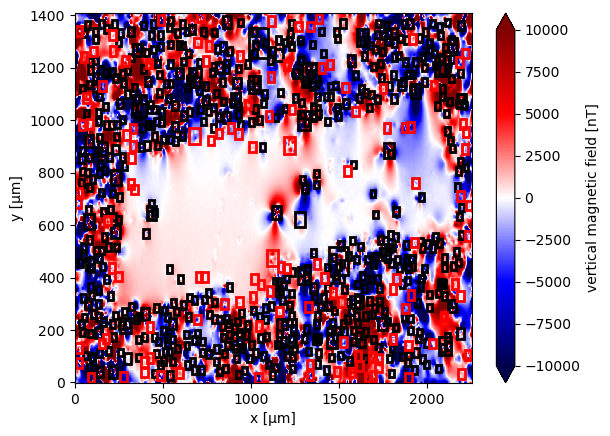

In [42]:
ax = plt.subplot(111)
data_up_copy_2.bz.plot.pcolormesh(ax=ax, cmap="seismic", vmin=-10000, vmax=10000)
for window in windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="k",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)   
for window in non_overlapping_windows:
    rect = matplotlib.patches.Rectangle(
        xy=[window[0], window[2]],
        width=window[1] - window[0],
        height=window[3] - window[2],
        edgecolor="r",
        fill=False,
        linewidth=2,
    )
    ax.add_patch(rect)

In [43]:
# np.asarray(calculated_r2_itr_euler_enhanced).T

# Show the observed and predicted data

In [44]:
predicted_data = mg.dipole_bz([coordinates[0], coordinates[1], data_up.z], positions_itr_enhanced, estimated_dipole_moments_itr_euler_enhanced)
residuo = data.bz.values - predicted_data

data_up = data_up.assign(predicted_data=(['y','x'],predicted_data))
data_up.predicted_data.attrs = {"long_name": "predicted-data", "units": "nT"}

error = data_up.bz.values - data_up.predicted_data.values

data_up = data_up.assign(error=(['y','x'],error))
data_up.error.attrs = {"long_name": "residual-data", "units": "nT"}

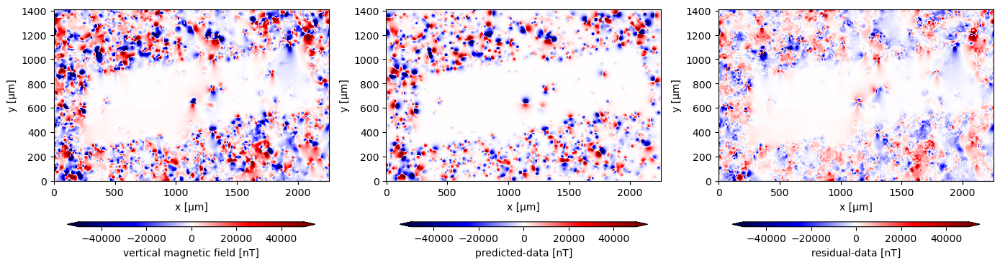

In [45]:
fig, axes = plt.subplots(1, 3, figsize=(14, 6))
cbar_kwargs = dict(orientation="horizontal", aspect=50, pad=0.1, shrink=0.9)
for field, ax in zip(["bz", "predicted_data", "error"], axes.ravel()):
    vmax = +50000
    vmin = -50000
    data_up[field].plot.pcolormesh(ax=ax, cmap="seismic", cbar_kwargs=cbar_kwargs, vmax=vmax, vmin=vmin)
for ax in axes.ravel():
    ax.set_aspect("equal")
plt.tight_layout()

1
Individual source:   R2 = 0.7351239396655369


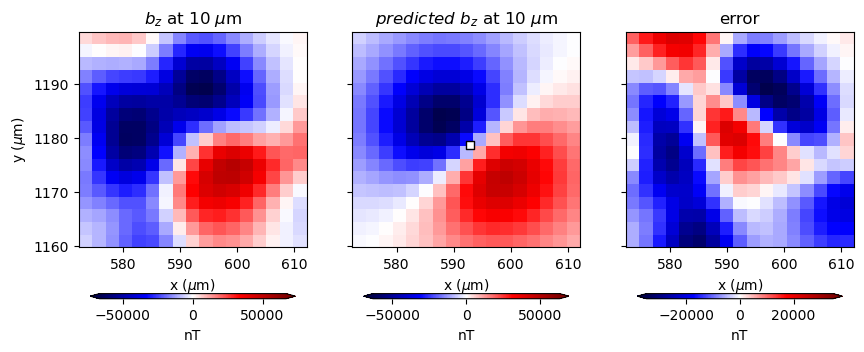

2
Individual source:   R2 = 0.9830468892248637


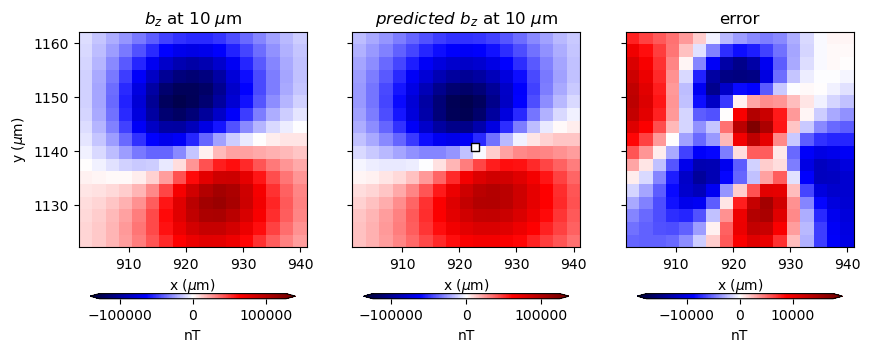

3
Individual source:   R2 = 0.9485589266713292


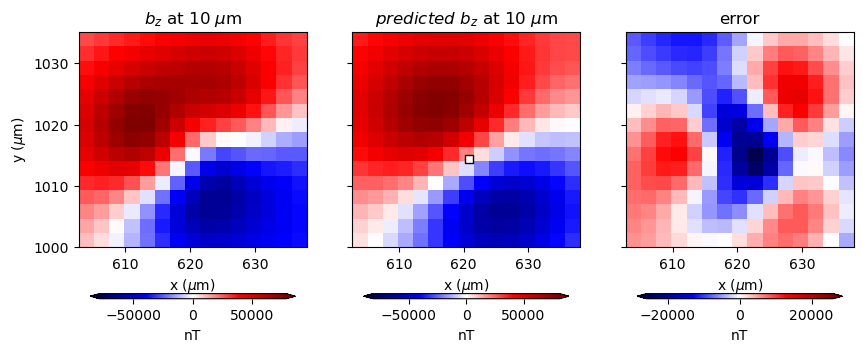

4
Individual source:   R2 = 0.8586799736559647


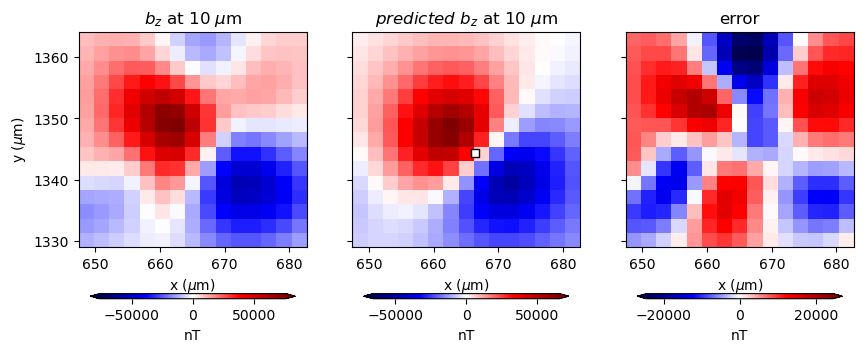

5
Individual source:   R2 = 0.846979379230395


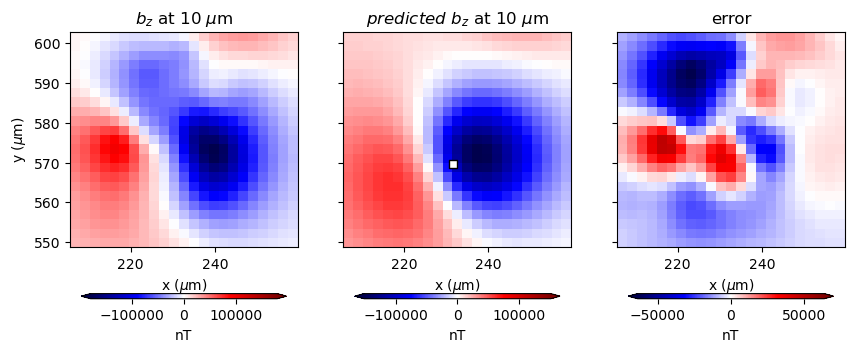

6
Individual source:   R2 = 0.09761374978086157


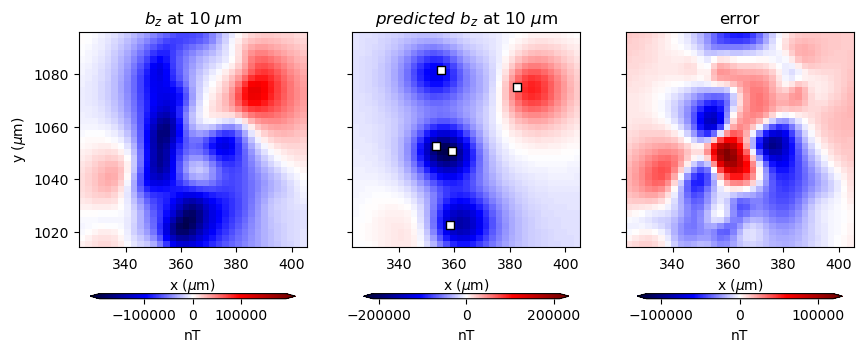

7
Individual source:   R2 = 0.8074490181679299


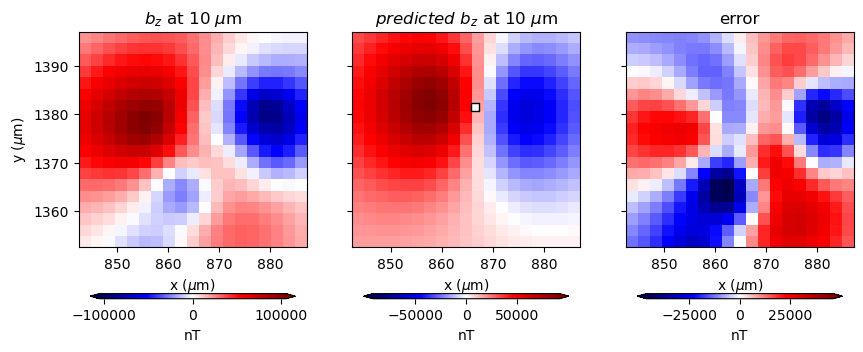

8
Individual source:   R2 = 0.8307437386724963


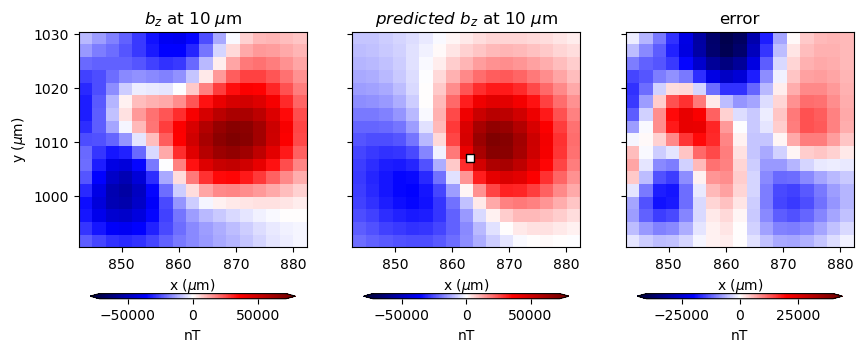

9
Individual source:   R2 = 0.7928763982580878


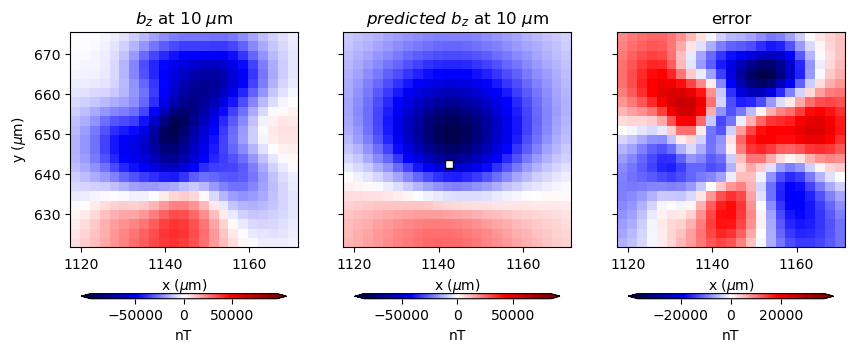

10
Individual source:   R2 = 0.8294069856917696


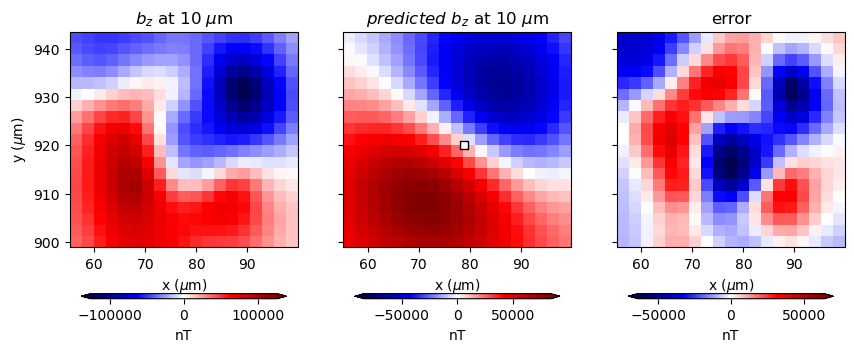

In [46]:
i = 0
slice_start=0#-20
slice_end=10#-1
for window, r2, base_level in zip(windows_enhanced[slice_start:slice_end], 
                                  calculated_r2_itr_euler_enhanced[slice_start:slice_end], 
                                  base_levels_itr_euler_enhanced[slice_start:slice_end]):

    if r2>=-np.inf:
        i=i+1
        print(i)
        # local_data = data_up.sel(x=slice(*window[:2]), y=slice(*window[2:]))
        local_data = data_up.copy(deep=True)
        local_data = local_data.sel(x=slice(*window[:2]), y=slice(*window[2:]))
        
        fig, axes = plt.subplots(1, 3, figsize=(10, 4), sharey="row")
        axes = axes.ravel()    
        cbar_kwargs = dict(orientation="horizontal", aspect=40, pad=0.15, shrink=0.9)
        
        ax = axes[0]
        ax.set_aspect("auto")
        ax.set_title(f"$b_z$ at {data.z.values[0,0] + height_difference:.0f} $\mu$m")
        ax.set_xlabel("x ($\mu$m)")
        ax.set_ylabel("y ($\mu$m)")
        local_data.bz.values +- base_level
        tmp = local_data.bz.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False)#, vmax=vmax, vmin=vmin)
        fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
        # ax.scatter(dipole_coordinates[0], dipole_coordinates[1], color='w', marker='o', edgecolors='k')
        
        ax = axes[1]
        ax.set_aspect("auto")
        ax.set_title(f"$predicted~b_z$ at {data.z.values[0,0] + height_difference:.0f} $\mu$m")
        ax.set_xlabel("x ($\mu$m)")
        local_data.predicted_data.values += base_level
        tmp = local_data.predicted_data.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False)#, vmax=vmax, vmin=vmin)
        fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
        ax.scatter(positions_itr_enhanced[0], positions_itr_enhanced[1], color='w', marker='s', edgecolors='k')
        
        ax = axes[2]   
        ax.set_aspect("auto")
        ax.set_title("error")
        ax.set_xlabel("x ($\mu$m)")
        
        local_data.error.values = local_data.bz.values - local_data.predicted_data.values
        tmp = local_data.error.plot.pcolormesh(ax=ax, cmap="seismic", add_colorbar=False, add_labels=False)
        fig.colorbar(tmp, ax=ax, label="nT", **cbar_kwargs,  extend='both')
        
    
        print(r"Individual source:   R2 = %s"%(r2))
    
        plt.show()

In [47]:
# Nome do arquivo ZIP
import os
output_folder = "csv_files_real_data"
os.makedirs(output_folder, exist_ok=True)

In [48]:
# Criar um DataFrame com os vetores
standard_dataframe = pd.DataFrame({
    'xmin': np.asarray(windows)[:, 0],
    'xmax': np.asarray(windows)[:, 1],
    'ymin': np.asarray(windows)[:, 2],
    'ymax': np.asarray(windows)[:, 3],
    'xc_standard': np.asarray(positions)[0, :],
    'yc_standard': np.asarray(positions)[1, :],
    'zc_standard': np.asarray(positions)[2, :],
    'mx_standard': np.asarray(estimated_dipole_moments)[:,0],
    'my_standard': np.asarray(estimated_dipole_moments)[:,1],
    'mz_standard': np.asarray(estimated_dipole_moments)[:,2],
    'r_2_standard': np.asarray(calculated_r2),
})
standard_csv_name = os.path.join(output_folder, nc_file.replace('.mat', '_standard.csv'))
standard_dataframe.to_csv(standard_csv_name, index=False)

# Criar DataFrame para os vetores iterativos
iterative_dataframe = pd.DataFrame({
    'xmin': np.asarray(windows_enhanced)[:, 0],
    'xmax': np.asarray(windows_enhanced)[:, 1],
    'ymin': np.asarray(windows_enhanced)[:, 2],
    'ymax': np.asarray(windows_enhanced)[:, 3],
    'xc_iterative': np.asarray(positions_itr_enhanced)[0, :],
    'yc_iterative': np.asarray(positions_itr_enhanced)[1, :],
    'zc_iterative': np.asarray(positions_itr_enhanced)[2, :],
    'mx_iterative': np.asarray(estimated_dipole_moments_itr_euler_enhanced)[:,0],
    'my_iterative': np.asarray(estimated_dipole_moments_itr_euler_enhanced)[:,1],
    'mz_iterative': np.asarray(estimated_dipole_moments_itr_euler_enhanced)[:,2],
    'r_2_iterative': np.asarray(calculated_r2_itr_euler_enhanced),
})

# # Salvar DataFrame iterativo como CSV
iterative_csv_name = os.path.join(output_folder, nc_file.replace('.mat', '_iterative.csv'))
iterative_dataframe.to_csv(iterative_csv_name, index=False)